In [11]:
import numpy as np
import pandas as pd

import tensorflow_hub as hub
import tensorflow_text
from tensorflow.keras.models import Sequential, load_model

from sklearn.model_selection import train_test_split
from sklearn.metrics import pairwise_distances, silhouette_score
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
from skimage.transform import resize

import networkx as nx
from node2vec import Node2Vec

import matplotlib.pyplot as plt
import seaborn as sns
import umap
from termcolor import colored


from tqdm.notebook import tqdm
import re
import nltk
import pickle
import swifter
import random

from os import listdir
from os.path import isfile, join
from collections import Counter
from random import randint

def getRoundedThresholdv1(a, MinClip):
    return round(float(a) / MinClip) * MinClip

In [271]:
def load_all_models(verbose=True):
    cluster_seq_emb = load_model('cluster_seq_emb.h5')
    
    if verbose:
        print('dialog embeder is here')

    with open('kmeans_phrases.pkl', 'rb') as f:
        clust_model_kmeans = pickle.load(f)
    with open('kmeans_phrases_names.pkl', 'rb') as f:
        cluster_names = pickle.load(f)
        
    if verbose:
        print('sent cluster model is here')

    with open('kmeans_seqs.pkl', 'rb') as f:
        ngram_kmeans = pickle.load(f)
    with open('kmeans_seqs_names.pkl', 'rb') as f:
        ngram_clusters_names = pickle.load(f)
    
    if verbose:
        print('dialog cluster model is here')
        
    embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3")
    if verbose:
        print('thats all')
    
    return cluster_seq_emb, clust_model_kmeans, cluster_names, ngram_kmeans, ngram_clusters_names, embed

cluster_seq_emb, clust_model_kmeans, cluster_names, ngram_kmeans, ngram_clusters_names, embed = load_all_models(verbose=True)

dialog embeder is here
sent cluster model is here
dialog cluster model is here
thats all


In [2]:
import tensorflow_hub as hub
import numpy as np
import tensorflow_text

# Some texts of different lengths.
english_sentences = ["dog", "Puppies are nice.", "I enjoy taking long walks along the beach with my dog."]
italian_sentences = ["cane", "I cuccioli sono carini.", "Mi piace fare lunghe passeggiate lungo la spiaggia con il mio cane."]
japanese_sentences = ["犬", "子犬はいいです", "私は犬と一緒にビーチを散歩するのが好きです"]

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3")

# Compute embeddings.
en_result = embed(english_sentences)
it_result = embed(italian_sentences)
ja_result = embed(japanese_sentences)

# Compute similarity matrix. Higher score indicates greater similarity.
similarity_matrix_it = np.inner(en_result, it_result)
similarity_matrix_ja = np.inner(en_result, ja_result)

In [3]:
dramas = [f for f in listdir('drama/') if isfile(join('drama/', f))]
dramas_texts = []


for drama in dramas:
    with open(join('drama/', drama), 'rb') as f:
        dramas_texts.append(pickle.load(f))

dramas_texts[0][0][:5]

[('Григорий', 'Ступай отвори дверь! звонят!'),
 ('Петр',
  'Да ты что сидишь? На ногах у тебя пузыри, что ли? встать не можешь?'),
 ('Иван', 'Ну, уж я пойду, так и быть, отворю! Это Андрюшка!'),
 ('Григорий', 'А, московская ворона! Откуда тебя принесло?'),
 ('Чужой слуга',
  'Ах ты, чухонский сын! Побегал бы ты с мое. Вот к цветочнице велела снесть, что на Петербургской. Небось четвертака на извозчика не\n            даст. Да и к вашему тож. Что, спит?')]

In [4]:
df_with_years = pd.read_csv('dracor-rus-list.csv', sep=',')
df_with_years.fillna(1000000, inplace=True)
df_with_years['year'] = df_with_years.apply(lambda x: min(x.written, x.premiered, x.printed), axis=1)
df_with_years['name'] = [link.split('/')[-1] for link in df_with_years['link']]

name_to_year = {name: year for name, year in zip(df_with_years['name'], df_with_years['year'])}
years = [name_to_year[name.split('.')[0]] for name in dramas]
years[:5]

[1840.0, 1850.0, 1765.0, 1851.0, 1850.0]

In [421]:
?sns.distplot

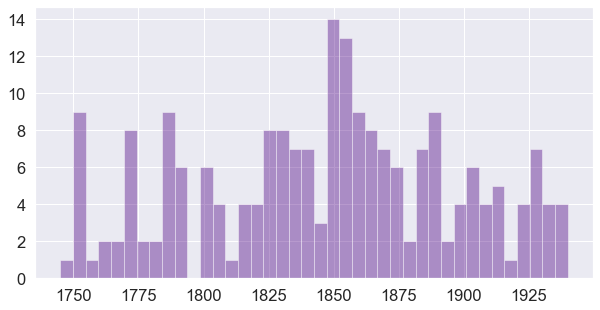

In [428]:
fig, ax = plt.subplots()
fig.set_size_inches(10, 5)

years_rnd = [getRoundedThresholdv1(year, 5) for year in years]
sns.distplot(years_rnd, bins=40, kde=False, color='indigo')

In [5]:
only_sents = []

for drama in tqdm(dramas_texts):
    for part in drama:
        only_sents = only_sents + [sent for _, sent in part]
        
only_sents = [sent for sent in only_sents if len(nltk.word_tokenize(sent))>0]    
only_sents[:5]

['Ступай отвори дверь! звонят!',
 'Да ты что сидишь? На ногах у тебя пузыри, что ли? встать не можешь?',
 'Ну, уж я пойду, так и быть, отворю! Это Андрюшка!',
 'А, московская ворона! Откуда тебя принесло?',
 'Ах ты, чухонский сын! Побегал бы ты с мое. Вот к цветочнице велела снесть, что на Петербургской. Небось четвертака на извозчика не\n            даст. Да и к вашему тож. Что, спит?']

In [6]:
def get_sent_vector(sent):
    return np.array(embed([sent])[0])
    
get_sent_vector('Извольте, сударь')

array([ 0.05614524, -0.06372134, -0.04249236, -0.00860117,  0.099751  ,
       -0.03129876,  0.04538656, -0.04919943, -0.00468883, -0.04281916,
        0.00877393,  0.04038748,  0.03681923, -0.05460533, -0.05094891,
       -0.01137543, -0.04485055, -0.03386084, -0.04103753,  0.03279722,
        0.03033264, -0.02919887,  0.03824612,  0.00337121,  0.01464133,
        0.00394431,  0.03056543, -0.00661694, -0.03457826, -0.01276411,
       -0.04666232,  0.06918392, -0.02308636, -0.104785  ,  0.01230131,
        0.00352046, -0.03369291, -0.01252667,  0.00055712, -0.0655474 ,
       -0.07604638, -0.00435911,  0.01967839,  0.01947444, -0.00258026,
       -0.01717229, -0.02072494, -0.05446532,  0.04609558,  0.04664139,
        0.00851444, -0.00724988, -0.05243349,  0.02848341, -0.05960152,
       -0.00139306, -0.08780015,  0.01847332, -0.0373492 , -0.02808224,
        0.00371374, -0.00462835,  0.04551379, -0.0281018 ,  0.01165996,
        0.022906  ,  0.05685975,  0.0150128 ,  0.00487473,  0.00

In [ ]:
vectors = [get_sent_vector(sent) for sent in tqdm(only_sents)]
sent_to_vector_dict = {sent: vec for sent, vec in tqdm(zip(only_sents, vectors))}

In [94]:
# for clust_num in [5, 10, 20, 40, 60, 100, 200]:
for clust_num in [50]:
#     clust_model_kmeans = KMeans(n_clusters=clust_num, random_state=42, precompute_distances=True)
#     clust_model_kmeans.fit(vectors)
    clusters = clust_model_kmeans.predict(vectors)
#     print('{}: {}'.format(clust_num, silhouette_score(X, clusters)))

In [95]:
sents_with_clusters = list(zip(only_sents, clust_model_kmeans.predict(vectors)))

In [ ]:
# cluster_names = {}

for curr_cluster in [37]:
    print(curr_cluster)
    sents_in_this_cluster = [sent for sent, cluster in sents_with_clusters if cluster==curr_cluster]
    for sent in random.choices(sents_in_this_cluster, k=20):
        print(sent)
    cluster_names[curr_cluster] = input()
    print('=========================\n=========================\n=========================\n\n\n')
cluster_names   


In [15]:
def cluster_text(per_text, cluster_model, cluster_names={}, sent_to_vector_dict={}):
    output = []
    all_clusters = []
    for person, sent in per_text:
        if sent in sent_to_vector_dict:
            sent_vec = sent_to_vector_dict[sent]
        else:
            sent_vec = get_sent_vector(sent)
        if sent_vec is not None:
            cluster =  clust_model_kmeans.predict([sent_vec])[0]
            sents = {sent: cluster}
            output.append((person, sents))
            all_clusters.append(cluster)
    return output, all_clusters

parsed_text, _ = cluster_text(dramas_texts[201][2], clust_model_kmeans, sent_to_vector_dict=sent_to_vector_dict)

for person, rep in parsed_text:
    print(person)
    for phrase in rep:
        print(phrase + ': ' + colored(rep[phrase], 'red'))
    print('\n')

Федор
Вот уж который день, брат Христиан, Мы сходимся с тех пор, как ты помолвлен Со Ксенией, и каждый раз тебя, Мне кажется, мы оба больше любим, Могли б тебя мы слушать без конца, Но ты досель о родине нам только Рассказывал своей…: 11


Ксения
Да, королевич, Пора, чтоб ты нам о себе поведал. Уже давно спросить тебя хочу я: Как вырос ты? И как доселе жил? И как во Фландрии сражался?: 4


Федор
Все, Все расскажи нам, Христиан. Мы стали Теперь с тобой родные; вместе нам Пришлося жить, так надо знать друг друга!: 4


Ксения
Начни сначала. Детство нам свое Сперва скажи!: 1


Христиан
Несложная то повесть, Царевна, будет: мой отец, король, Со мной простясь, услал меня ребенком Из города в норвежский дальний замок И указал там жить — зачем? — не знаю. Мрачны картины первых лет моих: Среди туманов северной природы, Под шум валов и сосен вековых Прошли мои младенческие годы. Мне помнятся раскаты непогоды, Громады гор, что к небу вознеслись, С гранитных скал струящиеся воды И крутизна, где за

In [ ]:
list(sent_to_vector_dict)[:10]

In [237]:
drama_lens = [sum([len(scene) for scene in drama]) for drama in dramas_texts]
list(zip(range(210), dramas, drama_lens))

[(0, 'gogol-lakeiskaja.pkl', 78),
 (1, 'prutkov-fantaziya.pkl', 340),
 (2, 'sumarokov-opekun.pkl', 282),
 (3, 'ostrovsky-bednaja-nevesta.pkl', 1163),
 (4, 'turgenev-mesjats-v-derevne.pkl', 1517),
 (5, 'nekrasov-zabrakovannye.pkl', 46),
 (6, 'blok-neznakomka.pkl', 191),
 (7, 'rostopchina-neludimka.pkl', 486),
 (8, 'sumarokov-pridanoe-obmanom.pkl', 310),
 (9, 'nekrasov-akter.pkl', 239),
 (10, 'knyazhnin-rosslav.pkl', 302),
 (11, 'gogol-zhenitba.pkl', 706),
 (12, 'kropotov-fomushka.pkl', 373),
 (13, 'ostrovsky-svoi-sobaki-gryzutsya-chuzhaya-ne-pristavaj.pkl', 457),
 (14, 'andreyev-mysl.pkl', 630),
 (15, 'turgenev-holostjak.pkl', 883),
 (16, 'ostrovsky-trudovoj-hleb.pkl', 808),
 (17, 'khmelnitsky-vzaimnye-ispytaniya.pkl', 330),
 (18, 'pushkin-stseny-iz-rytsarskih-vremen.pkl', 214),
 (19, 'majkov-agriopa.pkl', 306),
 (20, 'nikolev-samolyubivyj-stihotvorec.pkl', 772),
 (21, 'fonvizin-korion.pkl', 174),
 (22, 'zagoskin-blagorodnyj-teatr.pkl', 1340),
 (23, 'gogol-revizor.pkl', 926),
 (24, 'sum

In [249]:
# dramas_names = []
cluster_vecs = []

# for i, drama in tqdm(enumerate([dramas[11]])):
for part_num, part in enumerate(dramas_texts[113][:1]):
#         dramas_names.append(drama.split('.')[0] + '_{}_{}_{}'.format(i, part_num, len(part)))
    _, clusters = cluster_text(part, clust_model_kmeans, sent_to_vector_dict=sent_to_vector_dict)
    cluster_vecs.append(clusters)


done


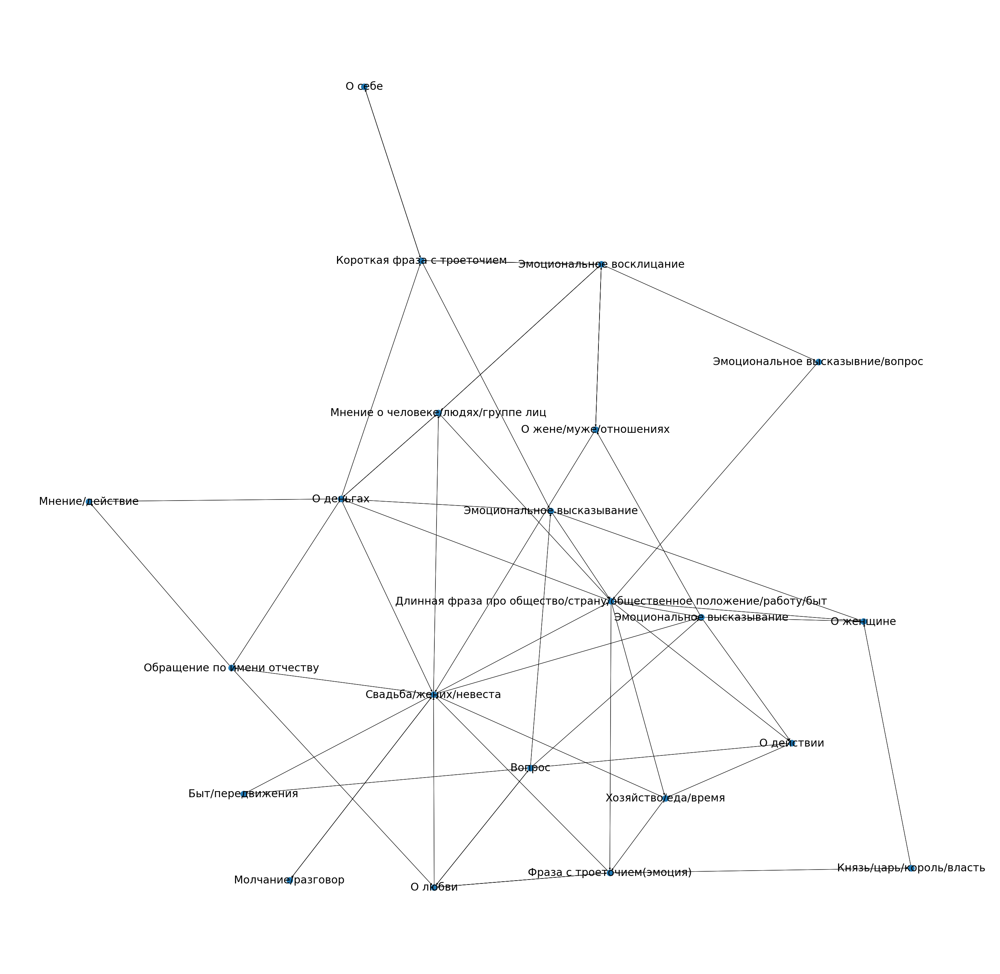

In [250]:
clusters_transmission_graph = nx.DiGraph()

for cluster_vec in tqdm(cluster_vecs):
    if len(cluster_vec) >=2:
        for i in range(len(cluster_vec) - 1):
            left_clust = cluster_vec[i]
            right_clust = cluster_vec[i + 1]
            if clusters_transmission_graph.has_edge(left_clust, right_clust):
                clusters_transmission_graph[left_clust][right_clust]['weight'] += 1
            else:
                clusters_transmission_graph.add_edge(left_clust, right_clust, weight=1)

fig, ax = plt.subplots()
fig.set_size_inches(50, 50)
curr_clust_names = {k:v for k,v in cluster_names.items() if k in list(clusters_transmission_graph.nodes)}
pos = nx.kamada_kawai_layout(clusters_transmission_graph)
nx.draw(clusters_transmission_graph, pos)
nx.draw_networkx_edges(clusters_transmission_graph, pos)
nx.draw_networkx_labels(clusters_transmission_graph, pos, curr_clust_names, font_size=30)

print('done')

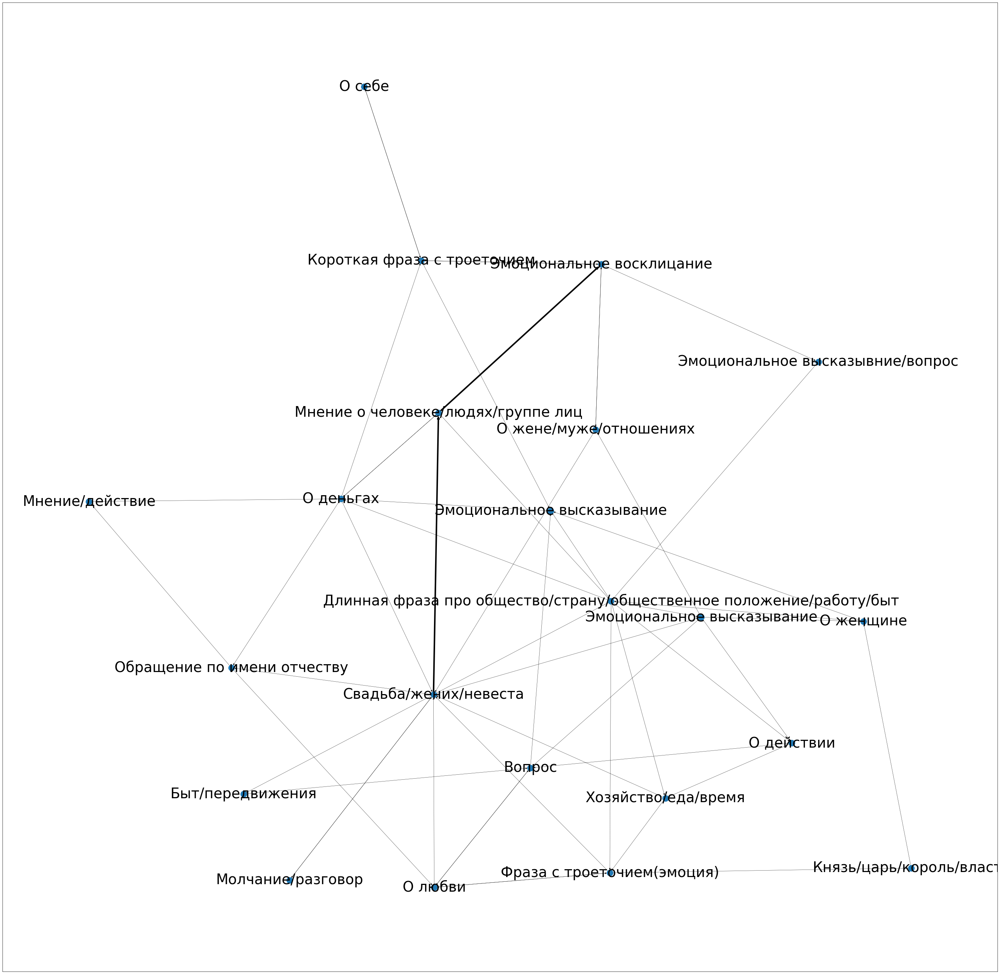

In [256]:
from math import exp
all_weights = []

for (node1, node2, data) in clusters_transmission_graph.edges(data=True):
    all_weights.append(data['weight']) #we'll use this when determining edge thickness
        
unique_weights = list(set(all_weights))

fig, ax = plt.subplots()
fig.set_size_inches(50, 50)
curr_clust_names = {k:v for k,v in cluster_names.items() if k in list(clusters_transmission_graph.nodes)}
pos = nx.kamada_kawai_layout(clusters_transmission_graph)
nx.draw_networkx_nodes(clusters_transmission_graph, pos)
nx.draw_networkx_labels(clusters_transmission_graph, pos, curr_clust_names, font_size=40)
for weight in unique_weights:
    weighted_edges = [(node1,node2) for (node1, node2, edge_attr) in 
                      clusters_transmission_graph.edges(data=True) if edge_attr['weight']==weight]
    width = (weight * 50 / sum(all_weights))**3
    nx.draw_networkx_edges(clusters_transmission_graph, pos, edgelist=weighted_edges, width=width)
    

In [254]:
btw_centrality = nx.centrality.betweenness_centrality(clusters_transmission_graph, normalized=True, weight='weight')
{cluster_names[k]: v for k, v in sorted(btw_centrality.items(), key=lambda item: -item[1])}

{'Свадьба/жених/невеста': 0.310515873015873,
 'Длинная фраза про общество/страну/общественное положение/работу/быт': 0.29484126984126985,
 'О деньгах': 0.2466269841269841,
 'Эмоциональное высказывание': 0.13055555555555556,
 'Короткая фраза с троеточием': 0.1400793650793651,
 'Вопрос': 0.10119047619047618,
 'О жене/муже/отношениях': 0.08829365079365079,
 'Эмоциональное восклицание': 0.08571428571428572,
 'Фраза с троеточием(эмоция)': 0.07896825396825397,
 'Обращение по имени отчеству': 0.07103174603174603,
 'О любви': 0.06805555555555556,
 'О женщине': 0.06349206349206349,
 'О действии': 0.03412698412698413,
 'Хозяйство/еда/время': 0.029761904761904764,
 'Мнение о человеке/людях/группе лиц': 0.025,
 'Быт/передвижения': 0.014484126984126986,
 'Мнение/действие': 0.014285714285714287,
 'Эмоциональное высказывние/вопрос': 0.00892857142857143,
 'Князь/царь/король/власть': 0.006944444444444445,
 'О себе': 0.0,
 'Молчание/разговор': 0.0}

In [157]:
cluster_names[8]

'Вера/обещание/прощение'

In [ ]:
# cluster_names = {}

# for curr_cluster in set(clust_model_kmeans.predict(X)):
# for curr_cluster in range(50):
for curr_cluster in [39]:
    print(curr_cluster)
    sents_in_this_cluster = [sent for sent, cluster in sents_with_clusters if cluster==curr_cluster]
    for sent in random.choices(sents_in_this_cluster, k=20):
        print(sent)
#     cluster_names[curr_cluster] = input()
    print('=========================\n=========================\n=========================\n\n\n')

In [161]:
node2vec = Node2Vec(clusters_transmission_graph, dimensions=2, walk_length=5, num_walks=5, workers=10)
embs = node2vec.fit(window=1, min_count=2)

Computing transition probabilities: 100%|██████████| 50/50 [00:00<00:00, 123.13it/s]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


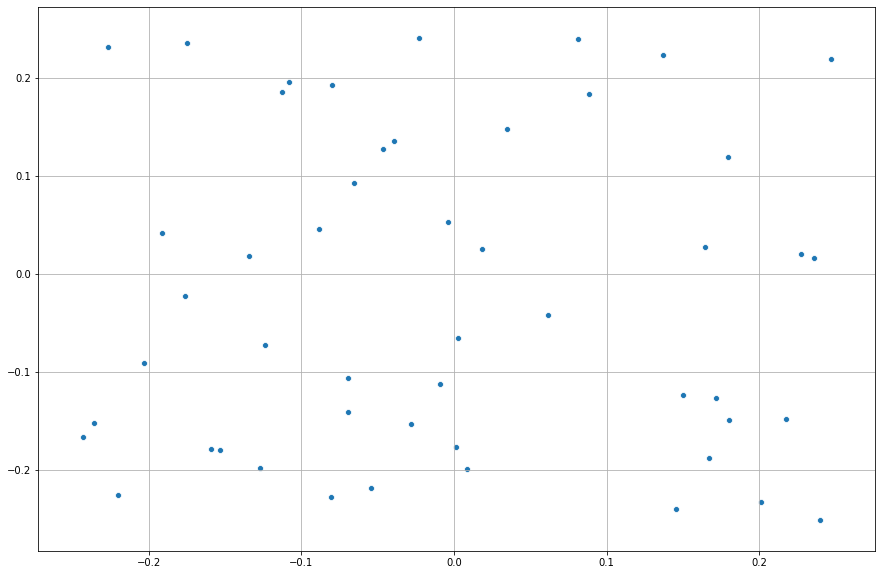

In [162]:
import seaborn as sns

clust_to_vec_list = [embs[str(clust)] for clust in range(50)]

fig, ax = plt.subplots()
fig.set_size_inches(15, 10)

sns.scatterplot(x=[x for x, y in clust_to_vec_list],
                y=[y for x, y in clust_to_vec_list])

plt.grid()

In [164]:
?cluster_text

In [166]:
def list_of_clusters_to_vec(clusters, clust_to_vec):
    if len(clusters) > 0:
        return np.mean([clust_to_vec[clust] for clust in clusters], axis=0)
    else:
        return np.array([0] * len(clust_to_vec['0']))


drama2vec = []

for i, drama in tqdm(enumerate(dramas)):
    for part_num, part in enumerate(dramas_texts[i]):
        _, clusters = cluster_text(part, clust_model_kmeans, sent_to_vector_dict=sent_to_vector_dict)
        drama2vec.append(list_of_clusters_to_vec([str(clust) for clust in clusters], embs))

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doin

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() 

In [ ]:
{dramas_name: i for i, dramas_name in enumerate(dramas_names) if 'gorky' in dramas_name}

In [ ]:
# 563

cos_dis = pairwise_distances(drama2vec, drama2vec, metric='euclidean')
dis_dict = {dramas_names[i]: dis for i, dis in enumerate(cos_dis[698])}
{k: v for k, v in sorted(dis_dict.items(), key=lambda item: item[1])}

In [ ]:
parsed_text, clusters1 = cluster_text(dramas_texts[37][18], clust_model_kmeans, sent_to_vector_dict=sent_to_vector_dict)

for person, rep in parsed_text:
    print(person)
    for phrase in rep:
        print(phrase + ': ' + colored(rep[phrase], 'red'))
    print('\n')

In [ ]:
parsed_text, clusters1 = cluster_text(dramas_texts[10][20], clust_model_kmeans, sent_to_vector_dict=sent_to_vector_dict)

for person, rep in parsed_text:
    print(person)
    for phrase in rep:
        print(phrase + ': ' + colored(rep[phrase], 'red'))
    print('\n')

In [ ]:
import seaborn as sns

fig, ax = plt.subplots()
fig.set_size_inches(30, 20)
# plt.xlim(0.6, 1.2)
# plt.ylim(-1.6, -0.8)

authors = [drama_name.split('-')[0] for drama_name in dramas_names]

authors_sizes = {author: 20 for author in authors}
authors_sizes['gogol'] = 200

sns.scatterplot(x=[x for x, y in drama2vec],
                y=[y for x, y in drama2vec],
                hue=authors,
                size=authors,
                sizes=authors_sizes)

plt.grid()

In [17]:
def ngrams_from_vec(vec, n=5):
    output = []
    if len(vec) <= n:
        return [[]]
    else:
        return [vec[i: i+n] for i in range(len(vec)-n)]


# ngrams_from_vec(cluster_vecs[0], n=5)

In [ ]:
103945

In [148]:
sum([v for k, v in ngram_counter.items()])

103945

Text(0, 0.5, 'Количество триграммов')

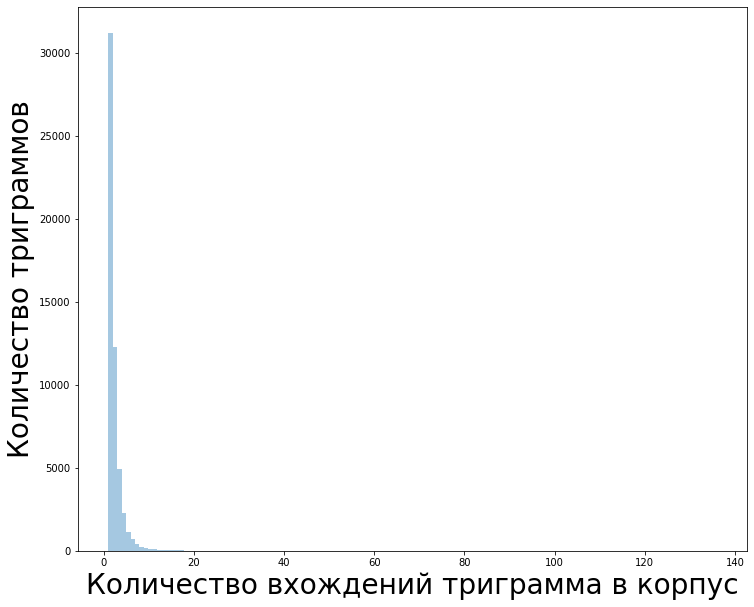

In [87]:
fig, ax = plt.subplots()
fig.set_size_inches(12, 10)
ax = sns.distplot([v for k, v in ngram_counter.items()], bins=136, kde=False)
ax.set_xlabel('Количество вхождений триграмма в корпус', fontsize=28)
ax.set_ylabel('Количество триграммов', fontsize=28)

In [146]:
all_ngrams = []

for clusters_vec in tqdm(cluster_vecs):
    all_ngrams.extend(ngrams_from_vec(clusters_vec, n=3))
    
# ngram_counter = Counter([','.join([str(x) for x in ngram]) for ngram in all_ngrams if 39 in ngram])
# ngram_counter = Counter([', '.join([cluster_names.get(x, str(x)) + ' ' + str(x) for x in ngram]) for ngram in all_ngrams if ngram != []])
ngram_counter = Counter([','.join([cluster_names.get(x, str(x)) for x in ngram]) for ngram in all_ngrams if ngram != []])

for ng, cnt in list(({k: v for k, v in sorted(ngram_counter.items(), key=lambda item: -item[1])}).items())[:10]:
    print('{}&{}&{}&{}\\\\\\hline'.format(ng.split(',')[0], ng.split(',')[1], ng.split(',')[2], cnt))
# {k: v for k, v in sorted(ngram_counter.items(), key=lambda item: -item[1])}


Чувство/религия/мифология&Чувство/религия/мифология&Чувство/религия/мифология&136\\\hline
Князь/царь/король/власть&Князь/царь/король/власть&Князь/царь/король/власть&113\\\hline
Короткий ответ&Вопрос-уточнение&Короткий ответ&80\\\hline
О деньгах&О деньгах&О деньгах&77\\\hline
Эмоциональное высказывание&Эмоциональное высказывание&Эмоциональное высказывание&69\\\hline
Мнение о человеке/людях/группе лиц&Мнение о человеке/людях/группе лиц&Мнение о человеке/людях/группе лиц&68\\\hline
Вопрос-уточнение&Короткий ответ&Вопрос-уточнение&67\\\hline
Длинное рассуждение (о высоких темах)&Чувство/религия/мифология&Чувство/религия/мифология&67\\\hline
Чувство/религия/мифология&Чувство/религия/мифология&Длинное рассуждение (о высоких темах)&66\\\hline
Чувство/религия/мифология&Длинное рассуждение (о высоких темах)&Чувство/религия/мифология&54\\\hline


In [21]:
# import tensorflow as tf
# tf.compat.v1.enable_eager_execution()

ngrams_sents = {}

for i, drama in tqdm(enumerate(dramas)):
    for part_num, part in enumerate(dramas_texts[i]):
#         try:
        text_with_clusters, clusters = cluster_text(part, clust_model_kmeans, sent_to_vector_dict=sent_to_vector_dict)
        cluster_ngrams_for_this_text = [','.join([str(x) for x in ngram]) 
                                        for ngram in ngrams_from_vec(clusters, n=3)]
        sent_ngrams_for_this_text = ngrams_from_vec([list(sent)[0] for _, sent in text_with_clusters], n=3)
        for ngram, sents_ngram in zip(cluster_ngrams_for_this_text, sent_ngrams_for_this_text):
            if ngrams_sents.get(ngram) is not None:
                ngrams_sents[ngram] = ngrams_sents[ngram] + [sents_ngram]
            else:
                ngrams_sents[ngram] = [sents_ngram]
#         except:
#             print(part_num)

In [45]:
for sents_set in ngrams_sents['14,38,14']:
    print('\n\n'.join(sents_set))
    print('============================\n'*3)

Они уж в столовой-с.

А маменька?

В столовой и онэ-с.

Играет-с.

В преферанс?

В свои козыри-с.

Сто сорок четвертая.

А строка?

Ну пятнадцатая.

Сто тридцать девятая.

А строка?

Тоже пятнадцатая.

Грозила.

Упрекала?

Упрекала.

Нездорова.

Нездорова?

Нездорова.

За деньгами.

Ты это сделала сознательно?

Совершенно сознательно.

Флегонт Егорыч-с.

Фамилия?

Попугайчиков-с.

Попугайчиков-с.

Звание?

Торгуем-с.

Двадцать пять сажен.

Вышина?

Пять сажен.

Ушел.

Далеко ли?

За реку.

Одной женщине.

Секрет?

Секрет. Вам.

Со Степкой-с.

На пристяжке караковая?

Караковая-с.

Актриса, вот и все.

Да актриса-то обыкновенная?

Публике нравится.

Пятьдесят.

Тысяч?

Пуговиц.

Крепко.

Солидно?

Солидно.

Купец.

Богатый?

Богатый.

Богатый.

И тароватый?

И тароватый.

Сейчас.

Сейчас?

Сейчас или никогда.

Утром, недавно.

Не пьяный?

Кажется, навеселе.

Беру-с.

Значит — солгали?

Солгал.

Да очень просто.

Она вас дожидается?

Дожидается..

В купеческом клубе.

И получил?

Получил

In [92]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(vectors)
embedding.shape

(116392, 2)

In [96]:
len(sents_with_clusters)

116392

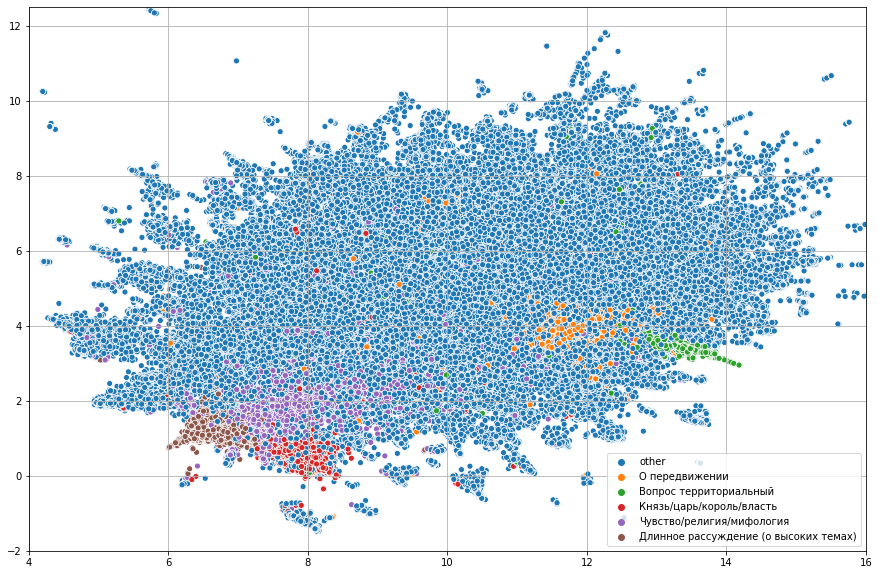

In [137]:
fig, ax = plt.subplots()
fig.set_size_inches(15, 10)


plt.clf()

plt.xlim(4, 16)
plt.ylim(-2, 12.5)
draw_clusters = [11,47,22, 29,39]

cl_sizes = {cl: 20 for cl in cluster_names}
for cl in draw_clusters:
    cl_sizes[cl] = 200

sns.scatterplot(x=[x for x, y in tqdm(embedding)],
                y=[y for x, y in tqdm(embedding)],
                hue=[cluster_names.get(cl)  if cl in draw_clusters else 'other' 
                     for _, cl in tqdm(sents_with_clusters)],
                palette=sns.color_palette(n_colors=6))
# sns.scatterplot(x=[x for x, y in tqdm(embedding)],
#                 y=[y for x, y in tqdm(embedding)],
#                 hue=[cluster_names.get(cl)  if cl in draw_clusters else 'other' 
#                      for _, cl in tqdm(sents_with_clusters)], 
#                 size=[cl for _, cl in tqdm(sents_with_clusters)],
#                 sizes=cl_sizes,
#                 legend=False)


plt.grid()

In [123]:
?sns.scatterplot

In [88]:
# language model
# cluster_vecs - порядки кластеров в диалогах
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Embedding, LSTM, Dense, TimeDistributed, Activation, Dropout
from tensorflow.keras.models import clone_model

clusters_num = 50
hidden_size = 10

model = Sequential()
model.add(LSTM(300, return_sequences=True, input_shape=(None, 512)))
model.add(Dropout(0.25))
model.add(TimeDistributed(Dense(128, activation='tanh')))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(32, activation='tanh'))
model.add(Dense(clusters_num, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['categorical_accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, None, 300)         975600    
_________________________________________________________________
dropout (Dropout)            (None, None, 300)         0         
_________________________________________________________________
time_distributed (TimeDistri (None, None, 128)         38528     
_________________________________________________________________
dense_1 (Dense)              (None, None, 64)          8256      
_________________________________________________________________
dropout_1 (Dropout)          (None, None, 64)          0         
_________________________________________________________________
dense_2 (Dense)              (None, None, 32)          2080      
_________________________________________________________________
dense_3 (Dense)              (None, None, 50)          1

In [91]:
from keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True,show_layer_names=True)

ImportError: Failed to import `pydot`. Please install `pydot`. For example with `pip install pydot`.

In [90]:
!pip install pydot

In [ ]:
X_lstm = [[clust_model_kmeans.cluster_centers_[cl] for cl in vec[:-1]] 
          for vec in cluster_vecs if len(vec) > 2]

# y_lstm = [to_categorical(vec[1:], num_classes=50) for vec in cluster_vecs if len(vec) > 2]

X_lstm_train, X_lstm_test, y_lstm_train, y_lstm_test = train_test_split(X_lstm, y_lstm, 
                                                                        test_size=0.2, random_state=42)
print(len(X_lstm_train))

def same_size_generator(X, y, batch_size=20):
    while True:
        X, y = shuffle(X, y)
        X = np.array(X)
        y = np.array(y)
        sizes = np.array([len(x) for x in X])
        single_sizes = shuffle(list(set(sizes)))
        for size in single_sizes:
            X_batch = X[np.where(sizes == size)]
            X_batch = np.array([list(x) for x in X_batch])
            y_batch = y[np.where(sizes == size)]
            y_batch = np.array([list(y) for y in y_batch])
            for index in range(0, len(X_batch), batch_size):
                yield X_batch[index: index+batch_size], y_batch[index: index+batch_size]
                

model.fit_generator(same_size_generator(X_lstm_train, y_lstm_train, batch_size=100), 
                    epochs=50,
                    steps_per_epoch=200,
                    validation_data=same_size_generator(X_lstm_test, y_lstm_test, batch_size=100), 
                    validation_steps=40)

In [ ]:
cluster_seq_emb = clone_model(model)

In [ ]:
cluster_seq_emb.pop()
cluster_seq_emb.summary()

In [168]:
embs['1']

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


array([-0.13432807,  0.01905454], dtype=float32)

In [259]:
ngrams_list = []
ngrams_vecs = []
for ngram in tqdm(ngrams_sents):
    if ngram != '':
        ngrams_list.append(ngram)
        ngrams_vecs.append([vec[-1] for vec in 
                            cluster_seq_emb.predict([[[clust_model_kmeans.cluster_centers_[int(cl)] for cl 
                                                      in ngram.split(',')]]])][-1])

In [260]:
reducer = umap.UMAP()
ngrams_embedding = reducer.fit_transform(ngrams_vecs)
ngrams_embedding.shape

(53877, 2)

In [272]:
# ngram_kmeans = KMeans(n_clusters=50, random_state=42)
ngram_clusters = ngram_kmeans.predict(ngrams_vecs)

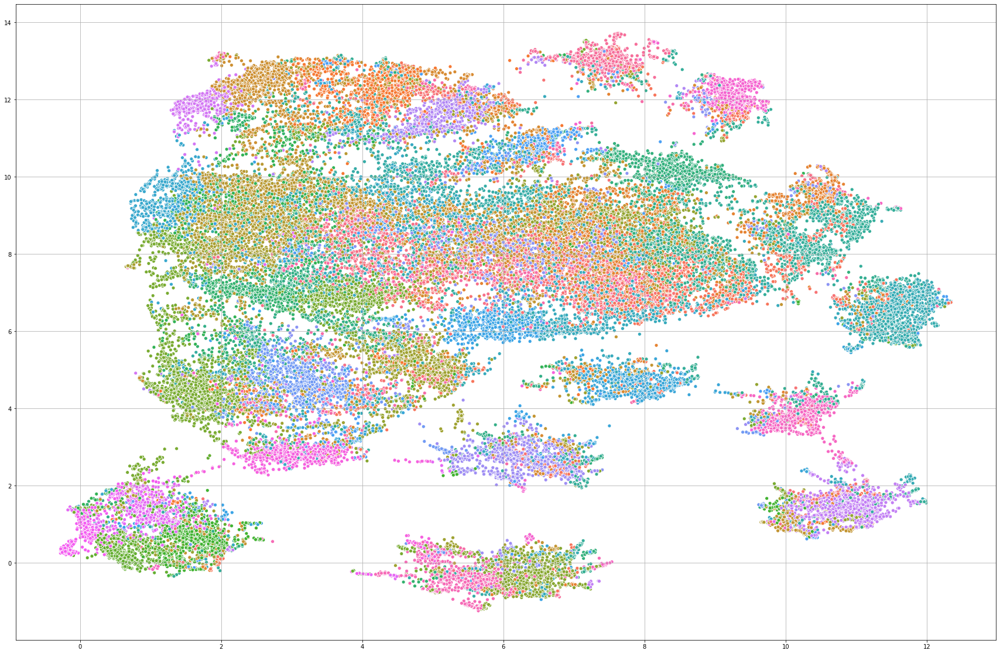

In [273]:
fig, ax = plt.subplots()
fig.set_size_inches(30, 20)


plt.clf()

# plt.xlim(4, 17)
# plt.ylim(0, 20)

sns.scatterplot(x=[x for x, y in tqdm(ngrams_embedding)],
                y=[y for x, y in tqdm(ngrams_embedding)],
                hue=[ngram_clusters_names.get(cl) for cl in ngram_clusters],
                legend=False)

plt.grid()

In [274]:
ngram_to_clusters = {ngram: cluster for ngram, cluster in zip(ngrams_list, ngram_clusters)}

In [275]:
ngram_clusters_names

{19: 'Диалог о семье/любви/свадьбе',
 33: 'Диалог из вопросов и ответов (в основном вопрос-ответ-вопрос)',
 7: 'Один из персонажей говорит, а второй немного вмешивается в диалог',
 11: 'Обмен информации, запрос на информацию (о знании)',
 21: 'Разговор о матери/с матью',
 18: 'Разговор о том что можно/нельзя или возможно/невозможно',
 42: 'О свадьбе',
 16: 'Активное действие',
 13: 'Один/оба говорят о себе, своем положении/действиях',
 6: 'Длинные рассуждения о чувствах/религии/мифологии',
 14: 'Комбинации из коротких вопросов и ответов',
 30: 'Шутки/смех/обида',
 44: 'Комбинации из коротких вопросов и ответов',
 0: 'Про передвижение в пространстве (в основном короткие фразы)',
 8: 'Комбинации из коротких вопросов и ответов',
 4: 'Комбинация из коротких вопросов и ответов',
 27: 'Длинные диалоги про общество/страну/общественное положение/работу/быт',
 48: 'Описания',
 36: 'Быстрое действие (короткие и эмоциональные фразы)',
 25: 'Рассказ о себе/других людях',
 26: 'Диалог, где один из 

In [294]:
huge_clusters_len = {i: 0 for i in range(50)}
for ngram, cl in list(zip(ngrams_list, ngram_clusters)):
    huge_clusters_len[cl] += len(ngrams_sents[ngram])
    
{ngram_clusters_names[k] + ' {}'.format(k): v for k, v in sorted(huge_clusters_len.items(), key=lambda item: -item[1])}

{'Рассуждения на общественные темы 2': 6528,
 'Длинные рассуждения о чувствах/религии/мифологии 6': 4991,
 'Длинные рассуждения на разные темы 17': 4751,
 'Кто-то говорит о себе 29': 3691,
 'Комбинация из коротких вопросов и ответов 4': 3551,
 'Разговор с обращениями друг к другу по имени/отчеству 10': 3456,
 'Быт и деньги 43': 3075,
 'Длинные диалоги про общество/страну/общественное положение/работу/быт 27': 2970,
 'Активное действие 16': 2762,
 'Активное действие 15': 2673,
 'Фразы с троеточиями, которые обрамляют/прерывают более длинные рассуждения 32': 2630,
 'Комбинации из коротких вопросов и ответов 8': 2596,
 'Обмен длинными рассуждениями 24': 2567,
 'О власти/служении 34': 2563,
 'Комбинации из коротких вопросов и ответов 14': 2306,
 'Один из персонажей говорит, а второй немного вмешивается в диалог 7': 2284,
 'Диалог из вопросов и ответов (в основном вопрос-ответ-вопрос) 33': 2265,
 'Женщины/быт/дом 20': 2177,
 'Диалог с короткими эмоциональными фразами 41': 2082,
 'Действие, 

In [ ]:
for cluster in cluster_names:
    

In [304]:
# ngram_clusters_names = {}
ngram_with_clusters = list(zip(ngrams_list, ngram_clusters))

for curr_cluster in [24]:
#     if curr_cluster not in ngram_clusters_names:
    print(ngram_clusters_names.get(curr_cluster, curr_cluster))
    ngram_in_this_cluster = [ngram for ngram, cluster in ngram_with_clusters if cluster==curr_cluster]
    counter = 0
    for ngram in sorted(ngram_in_this_cluster, key=lambda x: -len(ngrams_sents[x]))[:20]:
        ngram_to_cluster_names = '"\\,,\\ "'.join([cluster_names[int(cl)] for cl in ngram.split(',')])
        print('"{}" len:{}'.format(ngram_to_cluster_names, len(ngrams_sents[ngram])))
        if counter <= 4:
            for sents_set in ngrams_sents[ngram][:3]:
                print('\n'.join(sents_set))
                print('\n')
            print('\n\n')
        counter += 1
#         ngram_clusters_names[curr_cluster] = input()
    print('=========================\n=========================\n=========================\n\n\n')
    


Обмен длинными рассуждениями
"Длинная фраза про общество/страну/общественное положение/работу/быт"\,,\ "Молчание/разговор"\,,\ "Длинная фраза про общество/страну/общественное положение/работу/быт" len:22
С Керженцевым в шахматы я не стану, как ты этого не понимаешь? Прошлый раз он с трех
              ходов зарезал меня... что же мне интересного играть с таким... Чигориным! И я все-таки
              понимаю, что это только игра, а он серьезен, как идол, и когда я проигрываю, считает
              меня ослом. Нет, не надо Керженцева!
Ну, поговоришь, вы с ним друзья.
Говори с ним сама, ты с ним любишь говорить, а я не хочу. Во-первых, говорить буду
              только я, а он будет молчать. Мало ли люди молчат, но он молчит ужасно противно! И
              потом, он просто надоел мне со своими дохлыми обезьянами, своей божественной мыслью --
              и лакеем Васькой, на которого он кричит, как буржуй. Экспериментатор! У человека такой
              великолепный лоб, за который за

In [ ]:
ngram_clusters_names

In [323]:
authors_drama_pics = {}
authors_drama_names = {}
for i, drama in tqdm(enumerate(dramas)):
    drama_pic = []
    for part_num, part in enumerate(dramas_texts[i]):
        try:
            text_with_clusters, clusters = cluster_text(part, clust_model_kmeans, sent_to_vector_dict=sent_to_vector_dict)
            cluster_ngrams_for_this_text = [','.join([str(x) for x in ngram]) 
                                            for ngram in ngrams_from_vec(clusters, n=3)]
            ngram_clusters = [ngram_to_clusters[ngram] for ngram in cluster_ngrams_for_this_text if ngram != '']
            if len(ngram_clusters) > 0:
                part_vec = list(np.sum([to_categorical(cl, 50) for cl in ngram_clusters], axis=0))
                drama_pic.append(list(normalize([part_vec])[0]))
        except:
            pass
    if len(drama_pic) > 2:
#         sns.heatmap(drama_pic)
#         plt.show()
#         plt.clf()
        drama_pic = resize(np.array(drama_pic), (5, 50))
    
        if authors_drama_pics.get('0total') is None:
            authors_drama_pics['0total'] = drama_pic
            authors_drama_names['0total'] = [drama]
        else:
            authors_drama_pics['0total'] = authors_drama_pics['0total'] + drama_pic
            authors_drama_names['0total'] = authors_drama_names['0total'] + [drama]
            
        year = getRoundedThresholdv1(years[i], 50)
        if authors_drama_pics.get(str(year)) is None:
            authors_drama_pics[str(year)] = drama_pic
            authors_drama_names[str(year)] = [drama]
        else:
            authors_drama_pics[str(year)] = authors_drama_pics[str(year)] + drama_pic
            authors_drama_names[str(year)] = authors_drama_names[str(year)] + [drama]
        
            
        if authors_drama_pics.get(drama.split('-')[0]) is None:
            authors_drama_pics[drama.split('-')[0]] = drama_pic
            authors_drama_names[drama.split('-')[0]] = [drama]
        else:
            authors_drama_pics[drama.split('-')[0]] = authors_drama_pics[drama.split('-')[0]] + drama_pic
            authors_drama_names[drama.split('-')[0]] = authors_drama_names[drama.split('-')[0]] + [drama]

In [324]:
authors_drama_pics_fc = {}
for i, drama in tqdm(enumerate(dramas)):
    drama_pic = []
    for part_num, part in enumerate(dramas_texts[i]):
        try:
            text_with_clusters, clusters = cluster_text(part, clust_model_kmeans, sent_to_vector_dict=sent_to_vector_dict)
            if len(clusters) > 0:
                part_vec = list(np.sum([to_categorical(cl, 50) for cl in clusters], axis=0))
                drama_pic.append(list(normalize([part_vec])[0]))
        except:
            pass
    if len(drama_pic) > 2:
#         sns.heatmap(drama_pic)
#         plt.show()
#         plt.clf()
        drama_pic = resize(np.array(drama_pic), (5, 50))
    
        if authors_drama_pics_fc.get('0total') is None:
            authors_drama_pics_fc['0total'] = drama_pic
            authors_drama_names['0total'] = [drama]
        else:
            authors_drama_pics_fc['0total'] = authors_drama_pics_fc['0total'] + drama_pic
            authors_drama_names['0total'] = authors_drama_names['0total'] + [drama]
            
        year = getRoundedThresholdv1(years[i], 50)
        if authors_drama_pics_fc.get(str(year)) is None:
            authors_drama_pics_fc[str(year)] = drama_pic
            authors_drama_names[str(year)] = [drama]
        else:
            authors_drama_pics_fc[str(year)] = authors_drama_pics_fc[str(year)] + drama_pic
            authors_drama_names[str(year)] = authors_drama_names[str(year)] + [drama]
        
            
        if authors_drama_pics_fc.get(drama.split('-')[0]) is None:
            authors_drama_pics_fc[drama.split('-')[0]] = drama_pic
            authors_drama_names[drama.split('-')[0]] = [drama]
        else:
            authors_drama_pics_fc[drama.split('-')[0]] = authors_drama_pics_fc[drama.split('-')[0]] + drama_pic
            authors_drama_names[drama.split('-')[0]] = authors_drama_names[drama.split('-')[0]] + [drama]

In [348]:
getRoundedThresholdv1(1719, 50)

1700

0total
['gogol-lakeiskaja.pkl', 'prutkov-fantaziya.pkl', 'sumarokov-opekun.pkl', 'ostrovsky-bednaja-nevesta.pkl', 'turgenev-mesjats-v-derevne.pkl', 'nekrasov-zabrakovannye.pkl', 'blok-neznakomka.pkl', 'rostopchina-neludimka.pkl', 'sumarokov-pridanoe-obmanom.pkl', 'nekrasov-akter.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


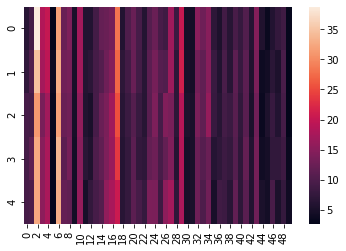

1750
['sumarokov-opekun.pkl', 'sumarokov-pridanoe-obmanom.pkl', 'majkov-agriopa.pkl', 'fonvizin-korion.pkl', 'sumarokov-gamlet.pkl', 'knyazhnin-olga.pkl', 'sumarokov-vzdorschitsa.pkl', 'lomonosov-tamira-i-selim.pkl', 'sumarokov-horev.pkl', 'lomonosov-demofont.pkl']
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


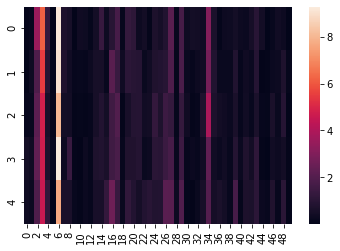

1800
['knyazhnin-rosslav.pkl', 'kropotov-fomushka.pkl', 'nikolev-samolyubivyj-stihotvorec.pkl', 'knyazhnin-vadim-novgorodskij.pkl', 'shakhovskoy-ne-lubo-ne-slushai.pkl', 'glinka-velzen.pkl', 'pushkin-boris-godunov.pkl', 'kokoshkin-vospitanie.pkl', 'pisarev-naslednica.pkl', 'shakhovskoy-pustodomy.pkl']
Рассуждения на общественные темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


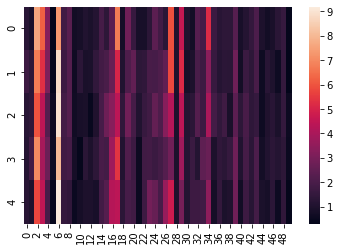

1850
['gogol-lakeiskaja.pkl', 'prutkov-fantaziya.pkl', 'ostrovsky-bednaja-nevesta.pkl', 'turgenev-mesjats-v-derevne.pkl', 'nekrasov-zabrakovannye.pkl', 'rostopchina-neludimka.pkl', 'nekrasov-akter.pkl', 'gogol-zhenitba.pkl', 'ostrovsky-svoi-sobaki-gryzutsya-chuzhaya-ne-pristavaj.pkl', 'turgenev-holostjak.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Длинные рассуждения на разные темы
Рассуждения на общественные темы
Рассуждения на общественные темы


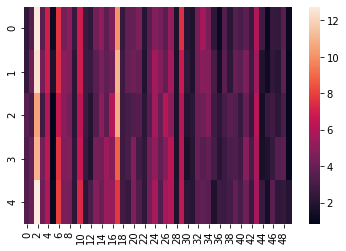

1900
['blok-neznakomka.pkl', 'andreyev-mysl.pkl', 'khlebnikov-snezhimochka.pkl', 'blok-korol-na-ploschadi.pkl', 'andreyev-ne-ubiy.pkl', 'bulgakov-zojkina-kvartira.pkl', 'gumilyov-ditja-allaha.pkl', 'chekhov-chaika.pkl', 'ostrovsky-bez-viny-vinovatye.pkl', 'gorky-vassa-zheleznova.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы


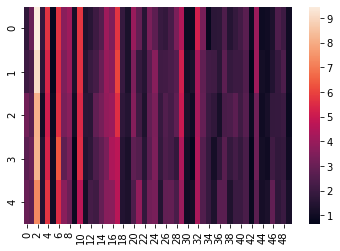

1950
['bulgakov-poslednie-dni.pkl', 'bulgakov-dni-turbinyh.pkl', 'gorky-egor-bulychov-i-drugie.pkl', 'bulgakov-vojna-i-mir.pkl', 'bulgakov-adam-i-eva.pkl', 'kedrin-rembrandt.pkl', 'bulgakov-kabala-svjatosh.pkl', 'bulgakov-batum.pkl', 'mayakovsky-klop.pkl', 'mayakovsky-banja.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы


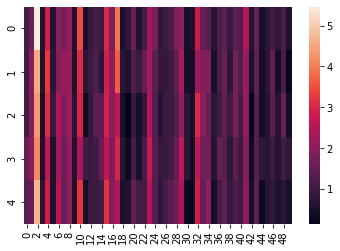

afinogenov
['afinogenov-mashenka.pkl']
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Длинные рассуждения на разные темы
Разговор о матери/с матью
Разговор о матери/с матью


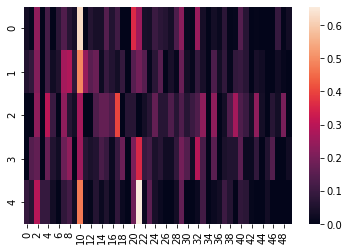

andreyev
['andreyev-mysl.pkl', 'andreyev-ne-ubiy.pkl', 'andreyev-k-zvezdam.pkl']
Рассуждения на общественные темы
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Разговор о матери/с матью


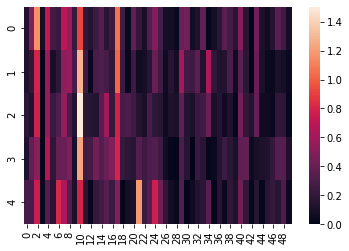

babel
['babel-zakat.pkl', 'babel-marija.pkl']
Длинные рассуждения на разные темы
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Обмен информации, запрос на информацию (о знании)
Активное действие


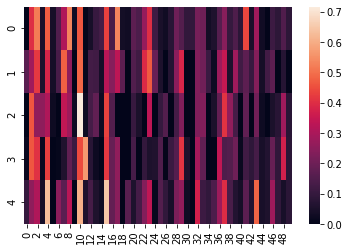

belsky
['belsky-skazanie-o-nevidimom-grade-kitezhe.pkl']
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


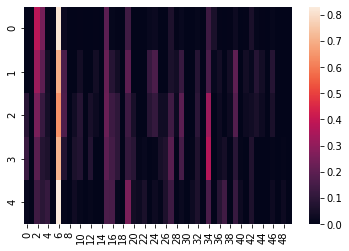

blok
['blok-neznakomka.pkl', 'blok-korol-na-ploschadi.pkl']
Комбинация из коротких вопросов и ответов
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


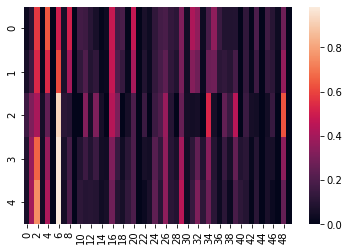

bulgakov
['bulgakov-poslednie-dni.pkl', 'bulgakov-zojkina-kvartira.pkl', 'bulgakov-dni-turbinyh.pkl', 'bulgakov-vojna-i-mir.pkl', 'bulgakov-adam-i-eva.pkl', 'bulgakov-kabala-svjatosh.pkl', 'bulgakov-batum.pkl', 'bulgakov-poloumnyj-zhurden.pkl', 'bulgakov-ivan-vasilevich.pkl', 'bulgakov-beg.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы


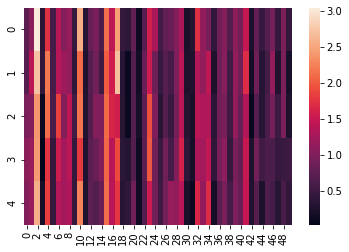

chekhov
['chekhov-chaika.pkl', 'chekhov-leshii.pkl', 'chekhov-vishnevyi-sad.pkl', 'chekhov-medved.pkl', 'chekhov-tri-sestry.pkl', 'chekhov-djadja-vanja.pkl', 'chekhov-predlozhenie.pkl', 'chekhov-ivanov.pkl', 'chekhov-na-bolshoi-doroge.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы


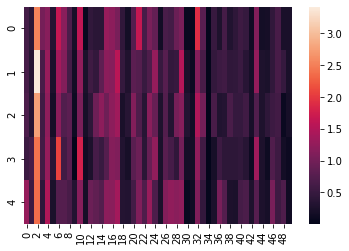

dashkova
['dashkova-toisiokov.pkl']
Рассуждения на общественные темы
Кто-то говорит о себе
Длинные диалоги про общество/страну/общественное положение/работу/быт
Вера/обещание/прощение
Рассуждения на общественные темы


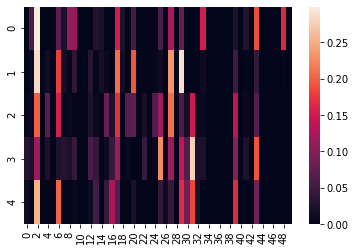

ekaterina
['ekaterina-vtoraja-o-vremja.pkl', 'ekaterina-vtoraja-iz-zhizni-rjurika.pkl']
О власти/служении
О власти/служении
О власти/служении
О власти/служении
О власти/служении


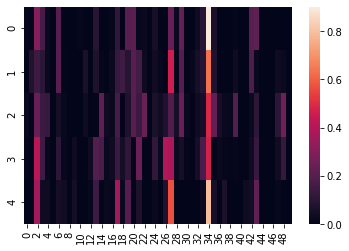

fonvizin
['fonvizin-korion.pkl', 'fonvizin-vybor-guvernera.pkl', 'fonvizin-brigadir.pkl', 'fonvizin-nedorosl.pkl']
О власти/служении
Длинные рассуждения о чувствах/религии/мифологии
О власти/служении
Рассуждения на общественные темы
Длинные рассуждения о чувствах/религии/мифологии


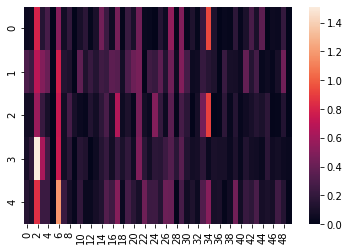

glinka
['glinka-velzen.pkl']
Длинные рассуждения на высокие темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


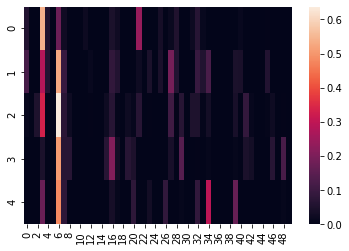

gogol
['gogol-lakeiskaja.pkl', 'gogol-zhenitba.pkl', 'gogol-revizor.pkl', 'gogol-utro-delovogo-cheloveka.pkl', 'gogol-igroki.pkl', 'gogol-tjazhba.pkl']
Разговор с обращениями друг к другу по имени/отчеству
Длинные рассуждения на разные темы
Диалог, где один из персонажей говорит о себе
Длинные рассуждения на высокие темы
Рассуждения на общественные темы


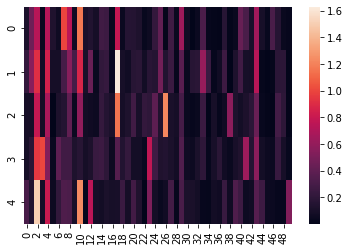

gorky
['gorky-egor-bulychov-i-drugie.pkl', 'gorky-vassa-zheleznova.pkl', 'gorky-na-dne.pkl']
Фразы с троеточиями
Фразы с троеточиями
Фразы с троеточиями, которые обрамляют/прерывают более длинные рассуждения
Фразы с троеточиями, которые обрамляют/прерывают более длинные рассуждения
Фразы с троеточиями, которые обрамляют/прерывают более длинные рассуждения


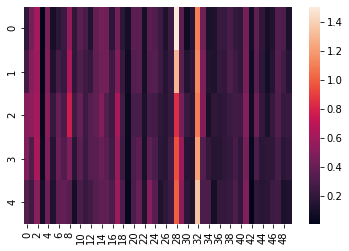

griboyedov
['griboyedov-gore-ot-uma.pkl', 'griboyedov-molodye-suprugi.pkl']
Длинные диалоги про общество/страну/общественное положение/работу/быт
Длинные рассуждения о чувствах/религии/мифологии
Комбинации из коротких вопросов и ответов
Длинные рассуждения на разные темы
Длинные рассуждения о чувствах/религии/мифологии


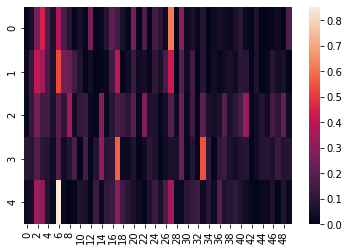

gumilyov
['gumilyov-ditja-allaha.pkl', 'gumilyov-gondla.pkl']
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


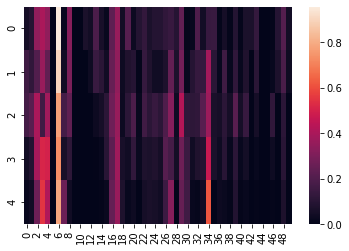

kapnist
['kapnist-antigona.pkl', 'kapnist-yabeda.pkl']
Длинные рассуждения на высокие темы
Длинные рассуждения на высокие темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


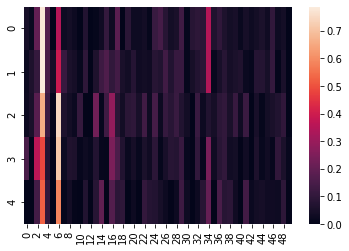

kedrin
['kedrin-rembrandt.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Длинные рассуждения о чувствах/религии/мифологии


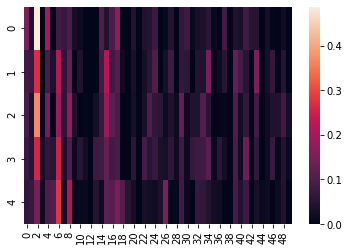

kheraskov
['kheraskov-venecianskaya-monahinya.pkl', 'kheraskov-plamena.pkl', 'kheraskov-osvobozhdennaja-moskva.pkl']
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


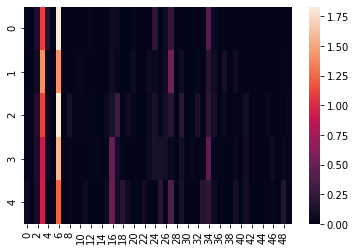

khlebnikov
['khlebnikov-snezhimochka.pkl']
Действие, короткие эмоциональные фразы
Длинные рассуждения о чувствах/религии/мифологии
Про передвижение в пространстве (в основном короткие фразы)
Про передвижение в пространстве (в основном короткие фразы)
Комбинация из коротких вопросов и ответов


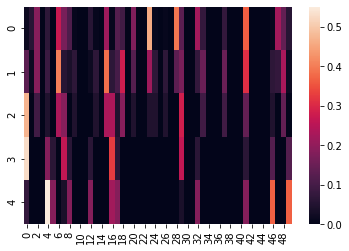

khmelnitsky
['khmelnitsky-vzaimnye-ispytaniya.pkl', 'khmelnitsky-govorun.pkl', 'khmelnitsky-svetskiy-sluchay.pkl', 'khmelnitsky-vozdushnye-zamki.pkl']
Длинные рассуждения на разные темы
Рассуждения на общественные темы
Диалог, где один из персонажей говорит о себе
Комбинация коротких вопросов и ответов
Активное действие


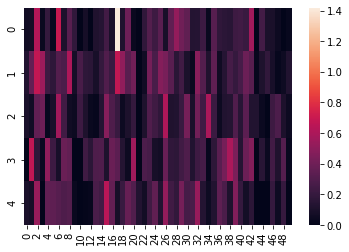

knyazhnin
['knyazhnin-rosslav.pkl', 'knyazhnin-vadim-novgorodskij.pkl', 'knyazhnin-olga.pkl', 'knyazhnin-traur.pkl', 'knyazhnin-neudachnyj-primiritel.pkl', 'knyazhnin-hvastun.pkl', 'knyazhnin-didona.pkl', 'knyazhnin-chudaki.pkl']
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


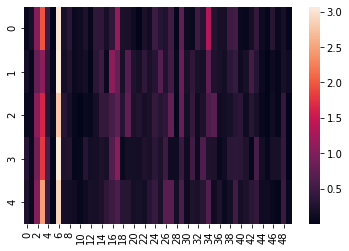

kokoshkin
['kokoshkin-vospitanie.pkl']
О власти/служении
Диалог о семье/любви/свадьбе
Диалог с короткими эмоциональными фразами
Диалог о семье/любви/свадьбе
О власти/служении


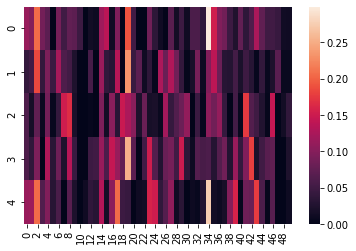

kropotov
['kropotov-fomushka.pkl']
Рассуждения на общественные темы
Кто-то говорит о себе
Рассуждения на общественные темы
Длинные рассуждения на разные темы
Длинные рассуждения о чувствах/религии/мифологии


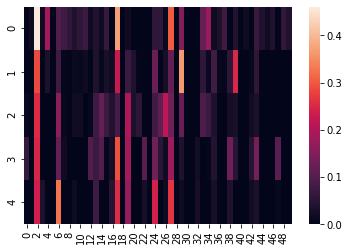

krylov
['krylov-podschipa-ili-trumf.pkl', 'krylov-sonnyj-poroshok.pkl', 'krylov-pirog.pkl', 'krylov-prokazniki.pkl', 'krylov-filomela.pkl', 'krylov-amerikantsy.pkl', 'krylov-modnaja-lavka.pkl', 'krylov-urok-dochkam.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


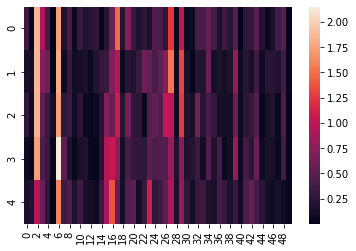

lazhechnikov
['lazhechnikov-okopirovalsya.pkl']
Длинные диалоги про общество/страну/общественное положение/работу/быт
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Диалог о семье/любви/свадьбе
Длинные рассуждения на высокие темы


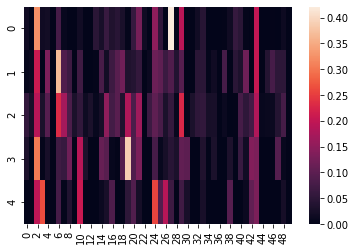

lensky
['lensky-horosha-i-durna.pkl']
Диалог о семье/любви/свадьбе
Длинные диалоги про общество/страну/общественное положение/работу/быт
Комбинация коротких вопросов и ответов
Кто-то говорит о себе
Рассуждения на общественные темы


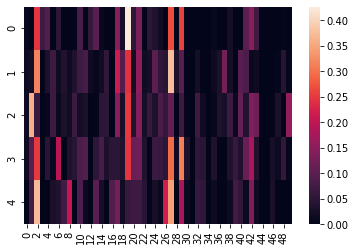

lermontov
['lermontov-strannyj-chelovek.pkl', 'lermontov-menschen-und-leidenschaften.pkl', 'lermontov-maskarad.pkl']
Рассуждения на общественные темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


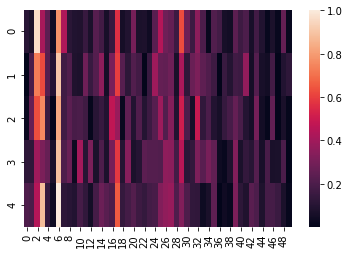

leskov
['leskov-rastochitel.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Кто-то говорит о себе
Разговор с обращениями друг к другу по имени/отчеству
Быстрое действие (короткие и эмоциональные фразы)


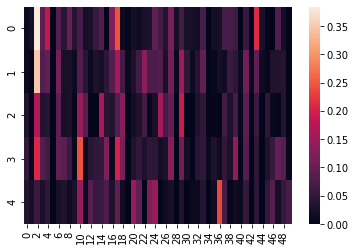

lomonosov
['lomonosov-tamira-i-selim.pkl', 'lomonosov-demofont.pkl']
Длинные рассуждения на высокие темы
Длинные рассуждения на высокие темы
Длинные рассуждения на высокие темы
Длинные рассуждения на высокие темы
Длинные рассуждения на высокие темы


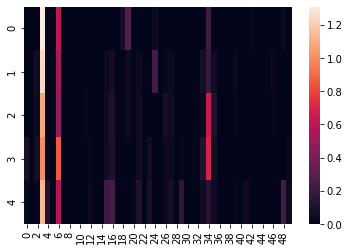

majkov
['majkov-agriopa.pkl', 'majkov-femist-i-ieronima.pkl']
Длинные рассуждения на высокие темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


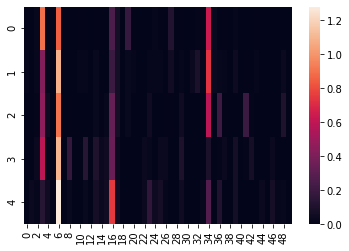

mamin
['mamin-sibirjak-malenkaja-pravda.pkl', 'mamin-sibirjak-zolotopromyshlenniki.pkl']
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству


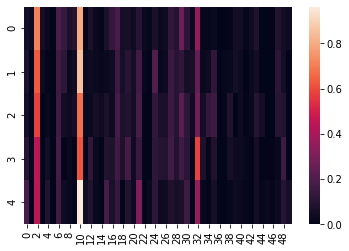

mayakovsky
['mayakovsky-klop.pkl', 'mayakovsky-banja.pkl', 'mayakovsky-misteriya-buff.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы


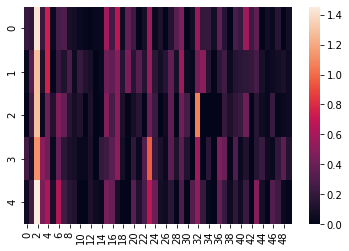

merezhkovsky
['merezhkovsky-pavel-pervyj.pkl']
Рассуждения на общественные темы
О власти/служении
Фразы с троеточиями, которые обрамляют/прерывают более длинные рассуждения
О власти/служении
Быстрое действие (короткие и эмоциональные фразы)


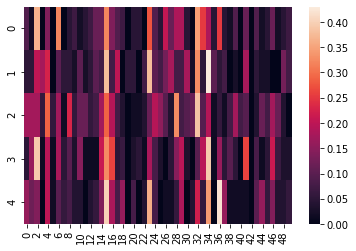

naydyonov
['naydyonov-deti-vanjushina.pkl']
Длинные рассуждения на разные темы
Длинные рассуждения на разные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы


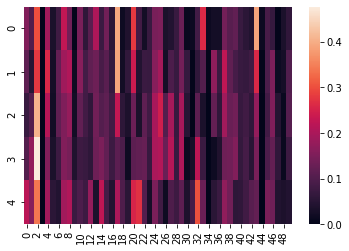

nekrasov
['nekrasov-zabrakovannye.pkl', 'nekrasov-akter.pkl', 'nekrasov-shila-v-meshke-ne-utaish.pkl']
Рассуждения на общественные темы
Длинные рассуждения на высокие темы
Активное действие
Один из персонажей говорит, а второй немного вмешивается в диалог
Рассуждения на общественные темы


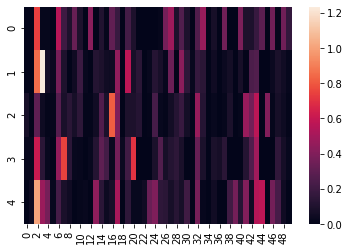

nikolev
['nikolev-samolyubivyj-stihotvorec.pkl']
Длинные рассуждения на разные темы
Фразы с троеточиями, которые обрамляют/прерывают более длинные рассуждения
Длинные рассуждения о чувствах/религии/мифологии
Рассуждения на общественные темы
Активное действие (призывы к действию)


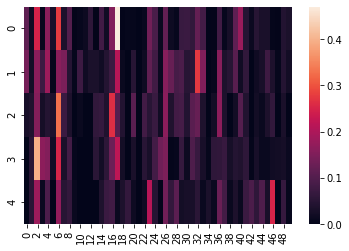

ostrovsky
['ostrovsky-bednaja-nevesta.pkl', 'ostrovsky-svoi-sobaki-gryzutsya-chuzhaya-ne-pristavaj.pkl', 'ostrovsky-trudovoj-hleb.pkl', 'ostrovsky-greh-da-beda-na-kogo-ne-zhivet.pkl', 'ostrovsky-ne-v-svoi-sani-ne-sadis.pkl', 'ostrovsky-puchina.pkl', 'ostrovsky-pozdnyaya-lyubov.pkl', 'ostrovsky-bez-viny-vinovatye.pkl', 'ostrovsky-na-bojkom-meste.pkl', 'ostrovsky-na-vsyakogo-mudreca-dovolno-prostoty.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы


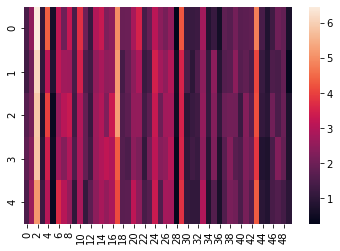

ozerov
['ozerov-dmitrij-donskoj.pkl']
Длинные рассуждения на высокие темы
Длинные рассуждения на высокие темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения на высокие темы
Длинные рассуждения на высокие темы


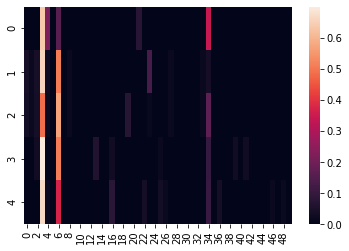

petrov
['petrov-ostrov-mira.pkl']
Комбинация из коротких вопросов и ответов
Комбинация из коротких вопросов и ответов
Комбинация из коротких вопросов и ответов
Комбинация из коротких вопросов и ответов
Кто-то говорит о себе


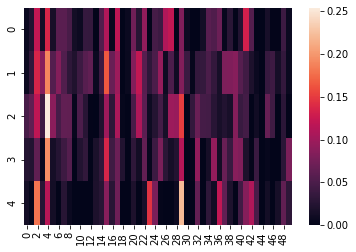

pisarev
['pisarev-naslednica.pkl', 'pisarev-lukavin.pkl', 'pisarev-poezdka-v-kronshtadt.pkl']
Длинные рассуждения на разные темы
Длинные рассуждения на разные темы
Длинные рассуждения на разные темы
Длинные рассуждения на разные темы
Длинные рассуждения на разные темы


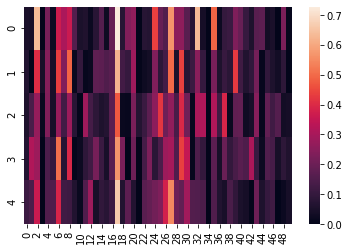

pisemskij
['pisemskij-gorkaja-sudbina.pkl']
Рассуждения на общественные темы
Рассказ о себе/других людях
Длинные диалоги про общество/страну/общественное положение/работу/быт
Длинные диалоги про общество/страну/общественное положение/работу/быт
Рассуждения на общественные темы


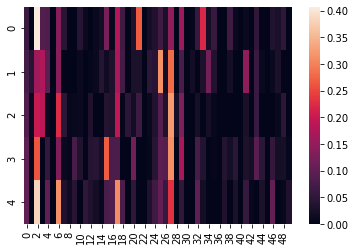

plavilshchikov
['plavilshchikov-sgovor-kutejkina.pkl', 'plavilshchikov-ermak-pokoritel-sibiri.pkl']
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Диалог о семье/любви/свадьбе
Диалог о семье/любви/свадьбе
Обмен длинными рассуждениями


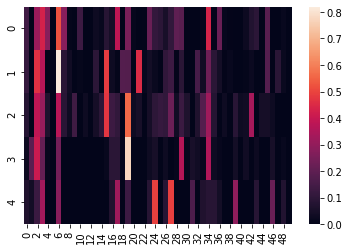

prutkov
['prutkov-fantaziya.pkl', 'prutkov-chereposlov-sirech-frenolog.pkl', 'prutkov-blondy.pkl', 'prutkov-srodstvo-mirovyh-sil.pkl']
Действие, короткие эмоциональные фразы
Рассуждения на общественные темы
Быстрое действие (короткие и эмоциональные фразы)
Комбинация из коротких вопросов и ответов
Быстрое действие (короткие и эмоциональные фразы)


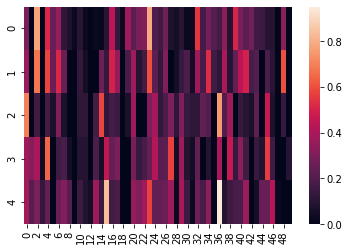

pushkin
['pushkin-boris-godunov.pkl', 'pushkin-kamenniy-gost.pkl', 'pushkin-rusalka.pkl', 'pushkin-skupoj-rytsar.pkl']
Длинные рассуждения на высокие темы
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения на разные темы
Длинные рассуждения на высокие темы
Рассуждения на общественные темы


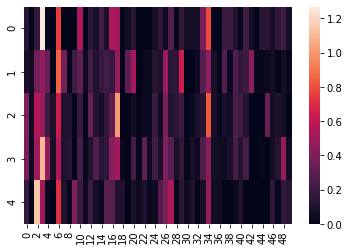

rostopchina
['rostopchina-neludimka.pkl']
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения на разные темы
Длинные рассуждения на разные темы
Диалог, где один из персонажей говорит о себе


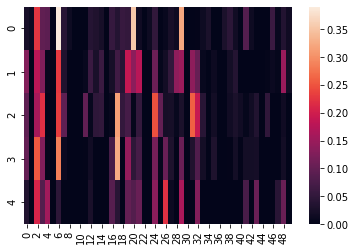

saltykov
['saltykov-shchedrin-smert-pazuhina.pkl']
Рассуждения на общественные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Активное действие
Разговор с обращениями друг к другу по имени/отчеству


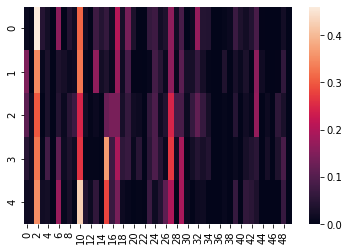

shakhovskoy
['shakhovskoy-ne-lubo-ne-slushai.pkl', 'shakhovskoy-pustodomy.pkl', 'shakhovskoy-svoya-semya.pkl', 'shakhovskoy-urok-koketkam.pkl']
Рассуждения на общественные темы
Длинные диалоги про общество/страну/общественное положение/работу/быт
Комбинация коротких вопросов и ответов
Длинные рассуждения на разные темы
Диалог, где один из персонажей говорит о себе


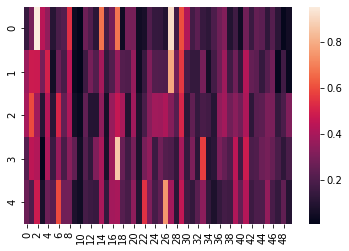

sollogub
['sollogub-chinovnik.pkl']
Комбинации из коротких вопросов и ответов
Комбинация коротких вопросов и ответов
Длинные рассуждения на разные темы
Разговор о том что можно/нельзя или возможно/невозможно
Рассуждения на общественные темы


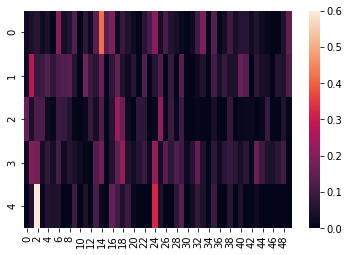

sudovshchikov
['sudovshchikov-neslyhannoe-divo.pkl']
Комбинация из коротких вопросов и ответов
Длинные рассуждения о чувствах/религии/мифологии
Рассказ о себе/других людях
Рассуждения на общественные темы
Активное действие


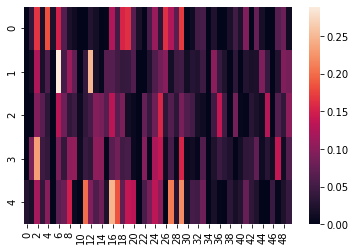

sukhovo
['sukhovo-kobylin-smert-tarelkina.pkl', 'sukhovo-kobylin-svadba-krechinskogo.pkl', 'sukhovo-kobylin-delo.pkl']
Длинные рассуждения на разные темы
Рассуждения на общественные темы
Рассуждения на общественные темы
Длинные рассуждения на разные темы
Разговор с обращениями друг к другу по имени/отчеству


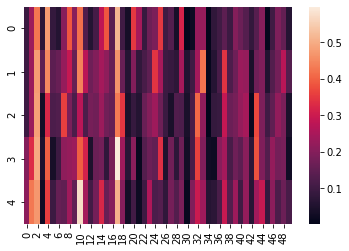

sumarokov
['sumarokov-opekun.pkl', 'sumarokov-pridanoe-obmanom.pkl', 'sumarokov-gamlet.pkl', 'sumarokov-vzdorschitsa.pkl', 'sumarokov-horev.pkl', 'sumarokov-dimitrij-samozvanets.pkl', 'sumarokov-semira.pkl', 'sumarokov-artistona.pkl', 'sumarokov-rogonosets-po-voobrazheniju.pkl', 'sumarokov-chudovischi.pkl']
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии
Длинные рассуждения о чувствах/религии/мифологии


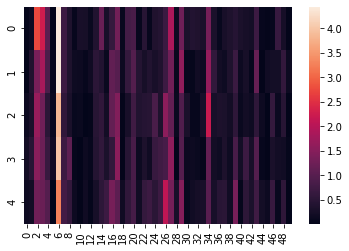

tolstoy
['tolstoy-zhivoy-trup.pkl', 'tolstoy-tsar-fedor-ioannovich.pkl', 'tolstoy-smert-ioanna-groznogo.pkl', 'tolstoy-vlast-tmy.pkl', 'tolstoy-tsar-boris.pkl']
О власти/служении
О власти/служении
О власти/служении
О власти/служении
О власти/служении


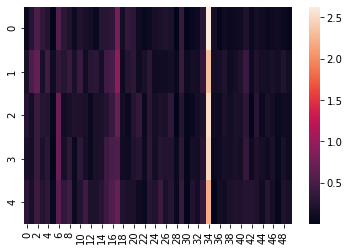

tretyakov
['tretyakov-protivogazy.pkl']
Комбинация из коротких вопросов и ответов
Комбинация из коротких вопросов и ответов
Короткие вопросы и ответы
Короткие вопросы и ответы
Короткие вопросы и ответы


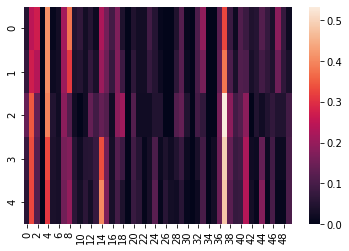

turgenev
['turgenev-mesjats-v-derevne.pkl', 'turgenev-holostjak.pkl', 'turgenev-neostorozhnost.pkl', 'turgenev-zavtrak-u-predvoditelja.pkl', 'turgenev-provintsialka.pkl']
Фразы с троеточиями, которые обрамляют/прерывают более длинные рассуждения
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству
Разговор с обращениями друг к другу по имени/отчеству


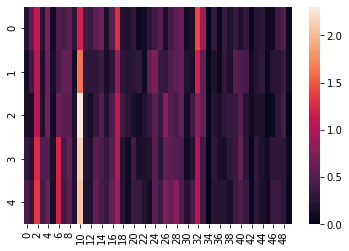

zagoskin
['zagoskin-blagorodnyj-teatr.pkl']
Рассуждения на общественные темы
Комбинация из коротких вопросов и ответов
Длинные рассуждения на разные темы
Длинные рассуждения на разные темы
Активное действие (призывы к действию)


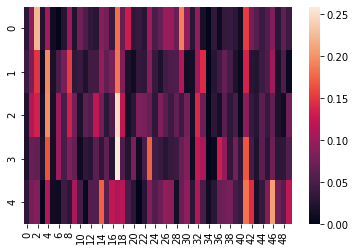

<Figure size 432x288 with 0 Axes>

In [325]:
for author in sorted(authors_drama_pics):
    print(author)
    print(authors_drama_names[author][:10])
    for theme in [ngram_clusters_names[np.argmax(line)] for line in authors_drama_pics[author]]:
        print(theme)
    sns.heatmap(authors_drama_pics[author])
    plt.show()
    plt.clf()

In [406]:
cluster_names[45] = 'Короткий утвердительный ответ/вопрос'

In [363]:
len(sorted(set([author.split('-')[0] for author in authors_drama_names['1950']])))

7

In [399]:
np.max(drama_pic)

0.675822601060082

0total
['gogol-lakeiskaja.pkl', 'prutkov-fantaziya.pkl', 'sumarokov-opekun.pkl', 'ostrovsky-bednaja-nevesta.pkl', 'turgenev-mesjats-v-derevne.pkl', 'nekrasov-zabrakovannye.pkl', 'blok-neznakomka.pkl', 'rostopchina-neludimka.pkl', 'sumarokov-pridanoe-obmanom.pkl', 'nekrasov-akter.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема


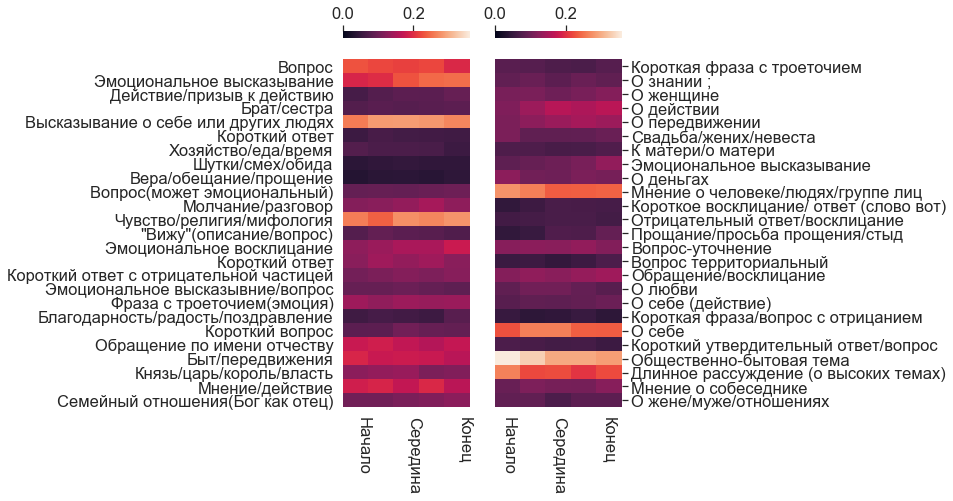

1750
['sumarokov-opekun.pkl', 'sumarokov-pridanoe-obmanom.pkl', 'majkov-agriopa.pkl', 'fonvizin-korion.pkl', 'sumarokov-gamlet.pkl', 'knyazhnin-olga.pkl', 'sumarokov-vzdorschitsa.pkl', 'lomonosov-tamira-i-selim.pkl', 'sumarokov-horev.pkl', 'lomonosov-demofont.pkl']
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

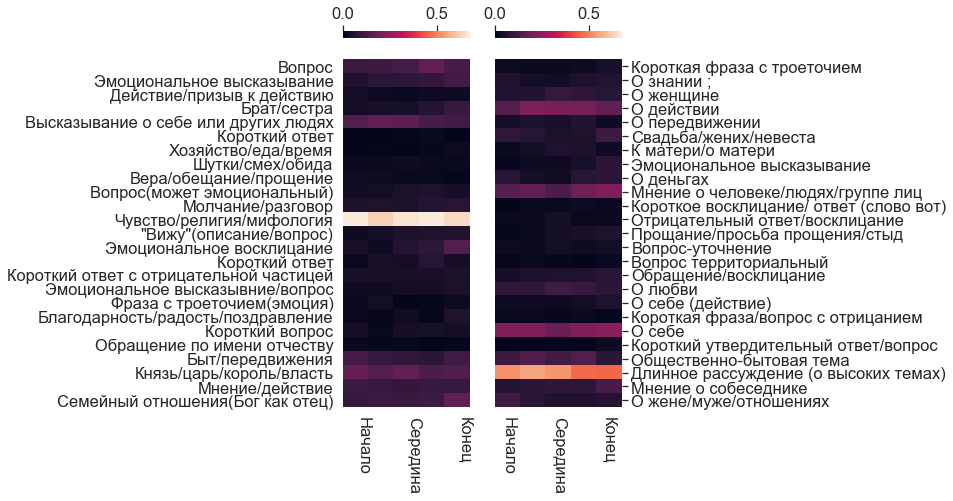

1800
['knyazhnin-rosslav.pkl', 'kropotov-fomushka.pkl', 'nikolev-samolyubivyj-stihotvorec.pkl', 'knyazhnin-vadim-novgorodskij.pkl', 'shakhovskoy-ne-lubo-ne-slushai.pkl', 'glinka-velzen.pkl', 'pushkin-boris-godunov.pkl', 'kokoshkin-vospitanie.pkl', 'pisarev-naslednica.pkl', 'shakhovskoy-pustodomy.pkl']
Длинное рассуждение (о высоких темах)
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

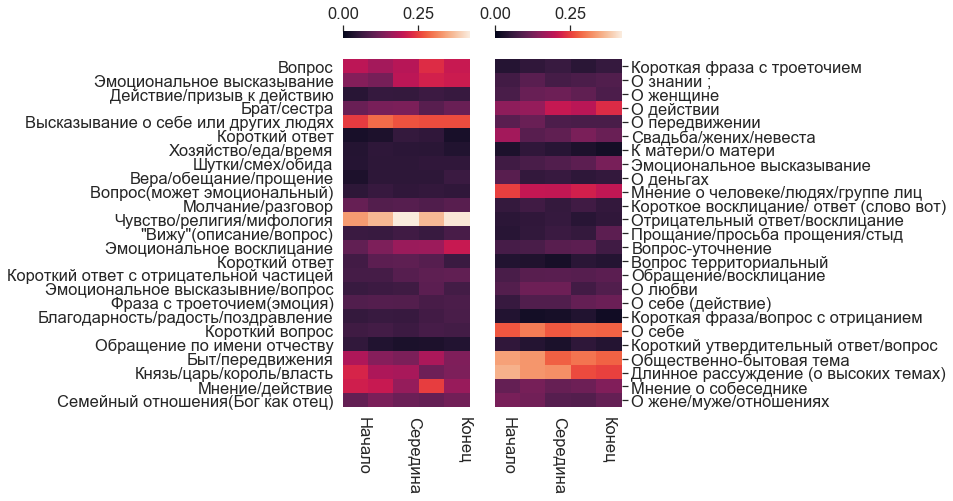

1850
['gogol-lakeiskaja.pkl', 'prutkov-fantaziya.pkl', 'ostrovsky-bednaja-nevesta.pkl', 'turgenev-mesjats-v-derevne.pkl', 'nekrasov-zabrakovannye.pkl', 'rostopchina-neludimka.pkl', 'nekrasov-akter.pkl', 'gogol-zhenitba.pkl', 'ostrovsky-svoi-sobaki-gryzutsya-chuzhaya-ne-pristavaj.pkl', 'turgenev-holostjak.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Высказывание о себе или других людях
Общественно-бытовая тема
Высказывание о себе или других людях


<Figure size 432x288 with 0 Axes>

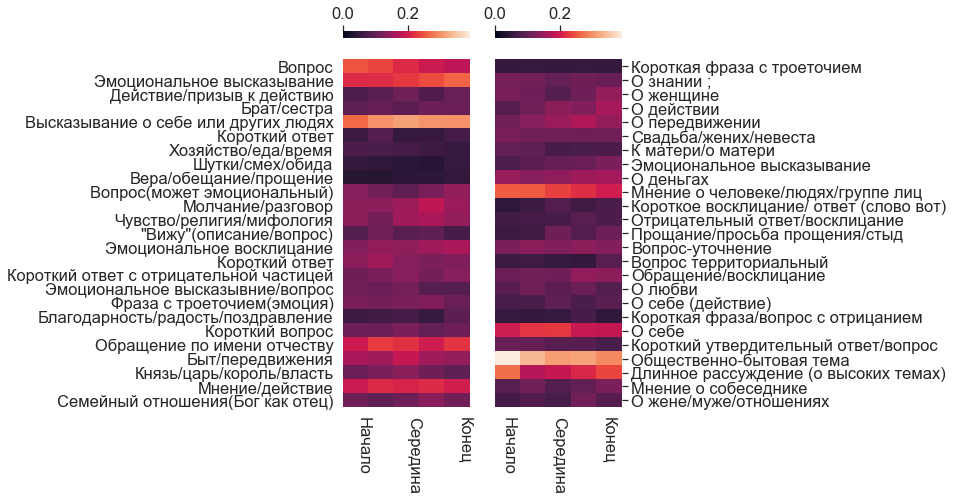

1900
['blok-neznakomka.pkl', 'andreyev-mysl.pkl', 'khlebnikov-snezhimochka.pkl', 'blok-korol-na-ploschadi.pkl', 'andreyev-ne-ubiy.pkl', 'bulgakov-zojkina-kvartira.pkl', 'gumilyov-ditja-allaha.pkl', 'chekhov-chaika.pkl', 'ostrovsky-bez-viny-vinovatye.pkl', 'gorky-vassa-zheleznova.pkl']
Мнение о человеке/людях/группе лиц
Общественно-бытовая тема
О себе
Высказывание о себе или других людях
Мнение о человеке/людях/группе лиц


<Figure size 432x288 with 0 Axes>

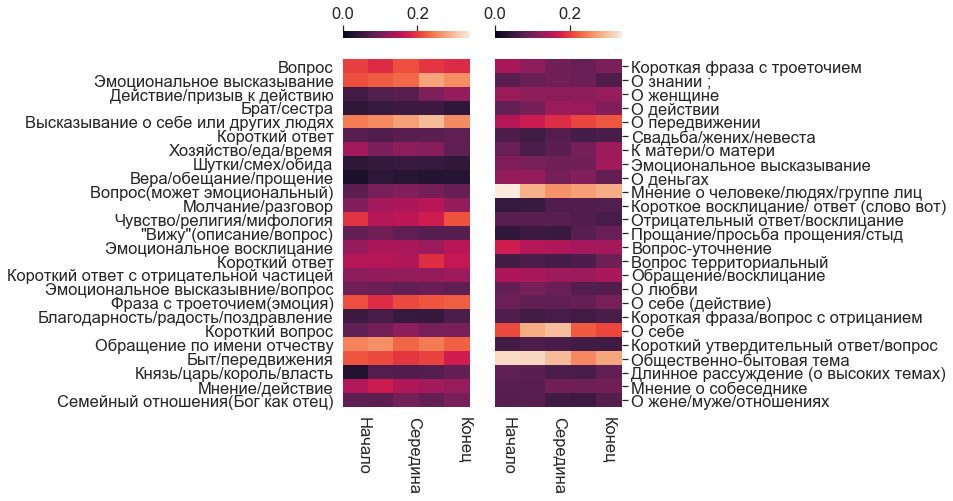

1950
['bulgakov-poslednie-dni.pkl', 'bulgakov-dni-turbinyh.pkl', 'gorky-egor-bulychov-i-drugie.pkl', 'bulgakov-vojna-i-mir.pkl', 'bulgakov-adam-i-eva.pkl', 'kedrin-rembrandt.pkl', 'bulgakov-kabala-svjatosh.pkl', 'bulgakov-batum.pkl', 'mayakovsky-klop.pkl', 'mayakovsky-banja.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

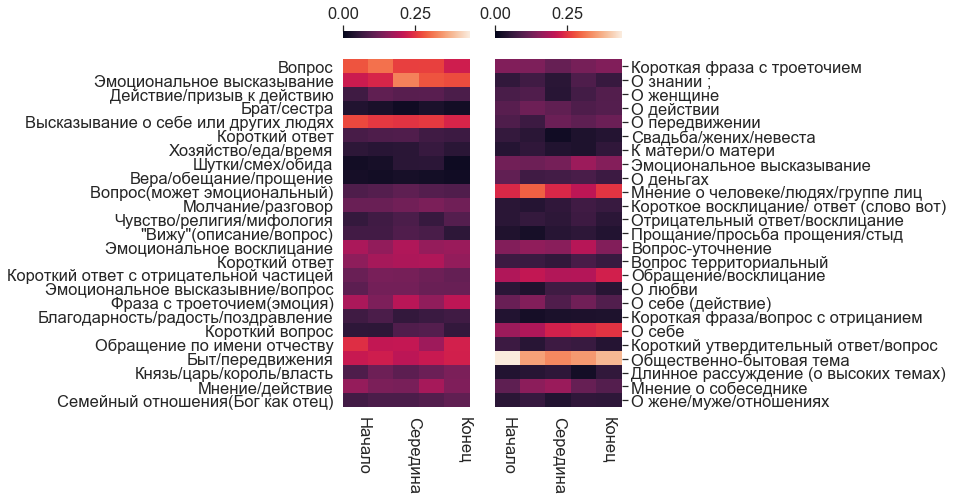

afinogenov
['afinogenov-mashenka.pkl']
Обращение по имени отчеству
Обращение по имени отчеству
Общественно-бытовая тема
Обращение по имени отчеству
Обращение по имени отчеству


<Figure size 432x288 with 0 Axes>

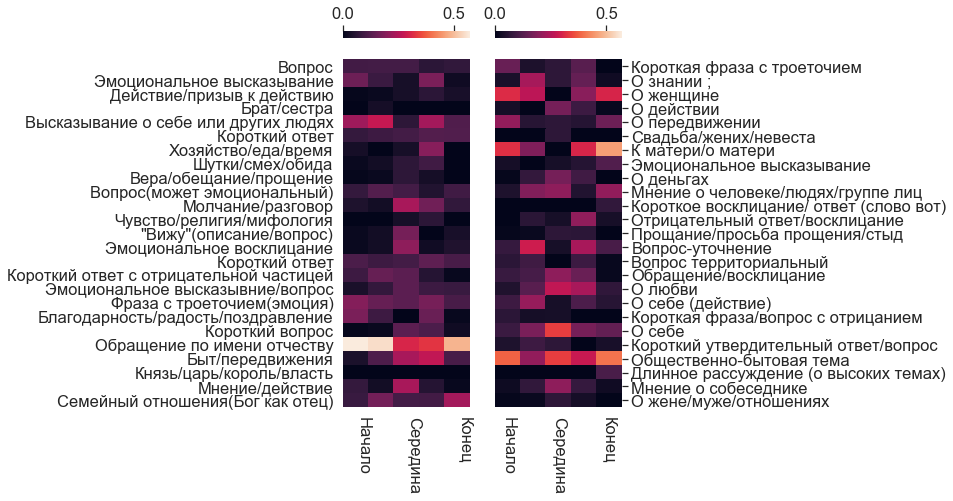

andreyev
['andreyev-mysl.pkl', 'andreyev-ne-ubiy.pkl', 'andreyev-k-zvezdam.pkl']
Общественно-бытовая тема
Обращение по имени отчеству
Обращение по имени отчеству
Обращение по имени отчеству
Высказывание о себе или других людях


<Figure size 432x288 with 0 Axes>

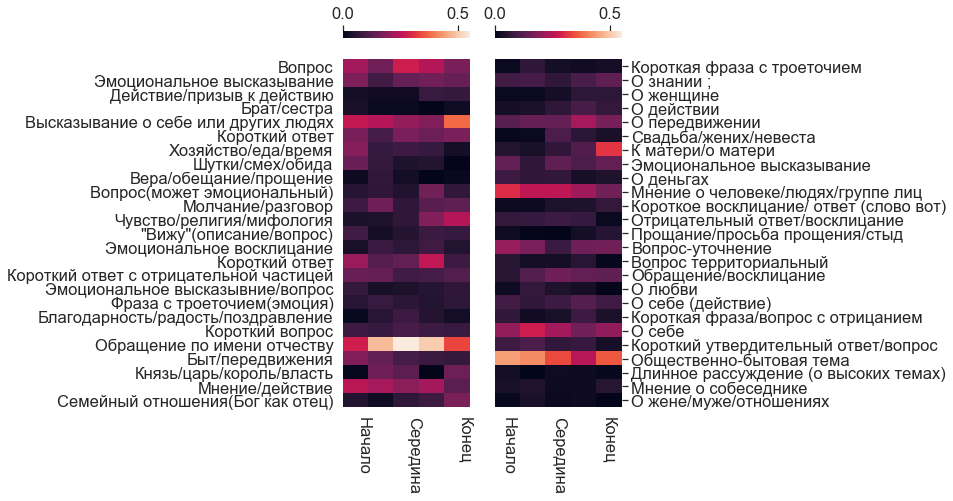

babel
['babel-zakat.pkl', 'babel-marija.pkl']
Общественно-бытовая тема
Мнение о человеке/людях/группе лиц
Обращение по имени отчеству
Вопрос-уточнение
Вопрос


<Figure size 432x288 with 0 Axes>

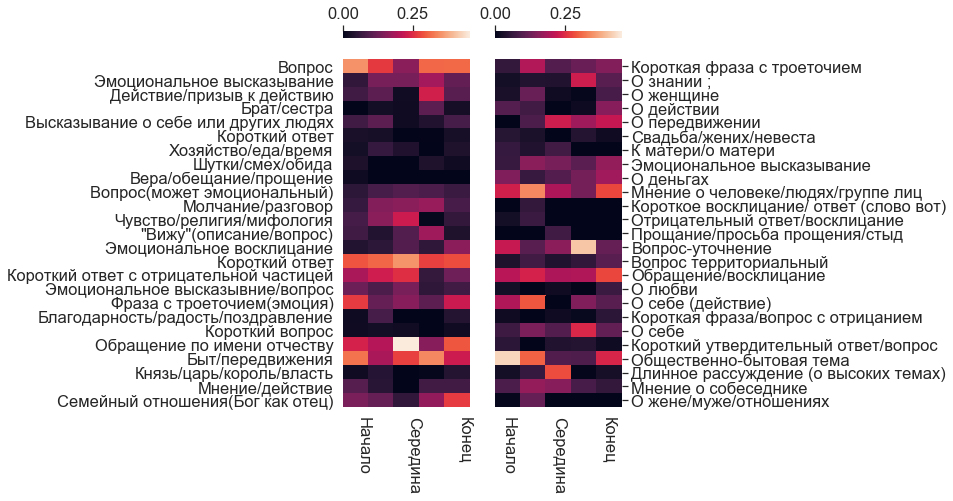

belsky
['belsky-skazanie-o-nevidimom-grade-kitezhe.pkl']
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

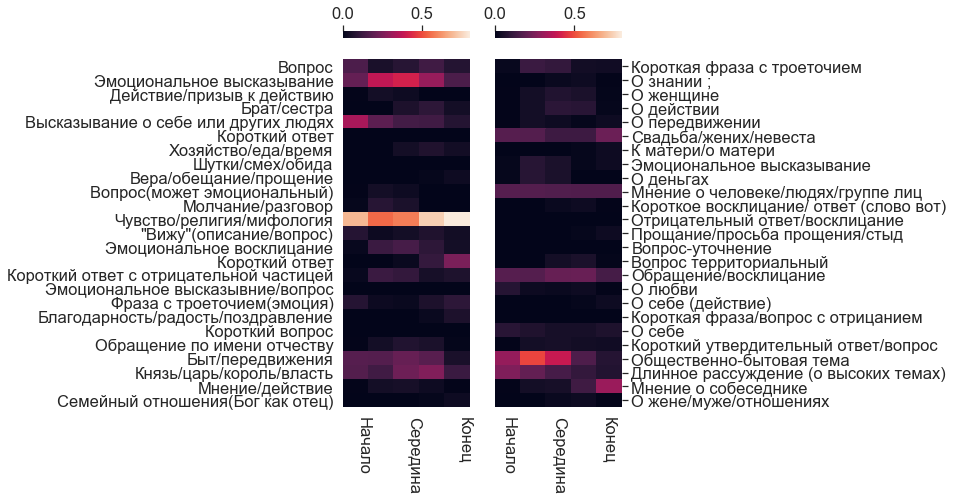

blok
['blok-neznakomka.pkl', 'blok-korol-na-ploschadi.pkl']
Мнение о человеке/людях/группе лиц
Мнение о человеке/людях/группе лиц
О действии
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

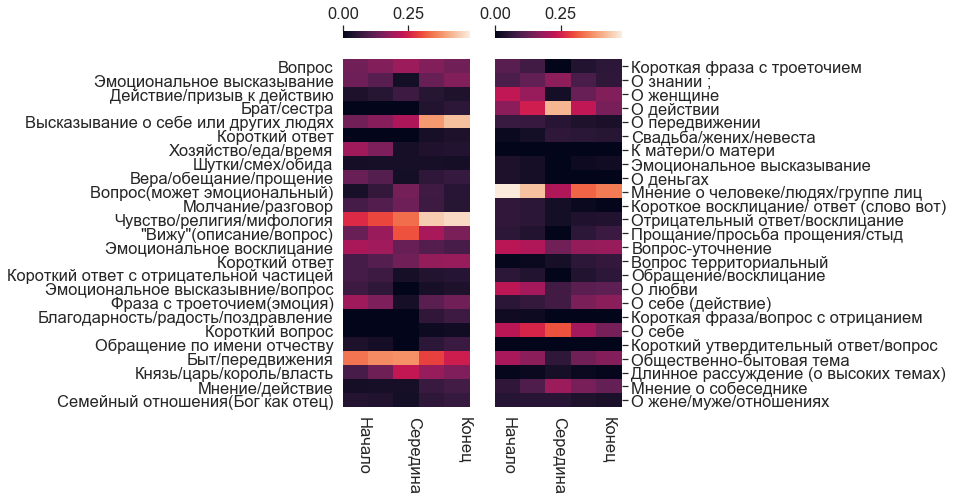

bulgakov
['bulgakov-poslednie-dni.pkl', 'bulgakov-zojkina-kvartira.pkl', 'bulgakov-dni-turbinyh.pkl', 'bulgakov-vojna-i-mir.pkl', 'bulgakov-adam-i-eva.pkl', 'bulgakov-kabala-svjatosh.pkl', 'bulgakov-batum.pkl', 'bulgakov-poloumnyj-zhurden.pkl', 'bulgakov-ivan-vasilevich.pkl', 'bulgakov-beg.pkl']
Общественно-бытовая тема
Вопрос
Эмоциональное высказывание
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

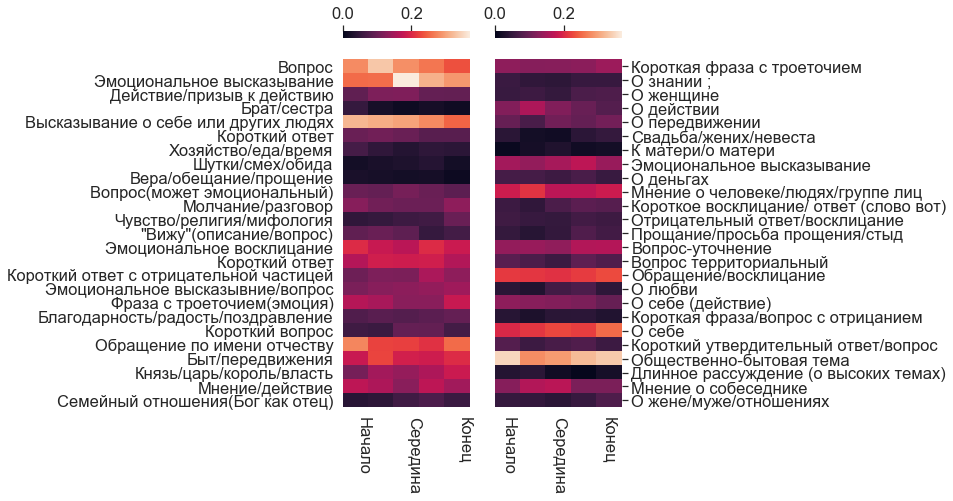

chekhov
['chekhov-chaika.pkl', 'chekhov-leshii.pkl', 'chekhov-vishnevyi-sad.pkl', 'chekhov-medved.pkl', 'chekhov-tri-sestry.pkl', 'chekhov-djadja-vanja.pkl', 'chekhov-predlozhenie.pkl', 'chekhov-ivanov.pkl', 'chekhov-na-bolshoi-doroge.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Высказывание о себе или других людях
О передвижении


<Figure size 432x288 with 0 Axes>

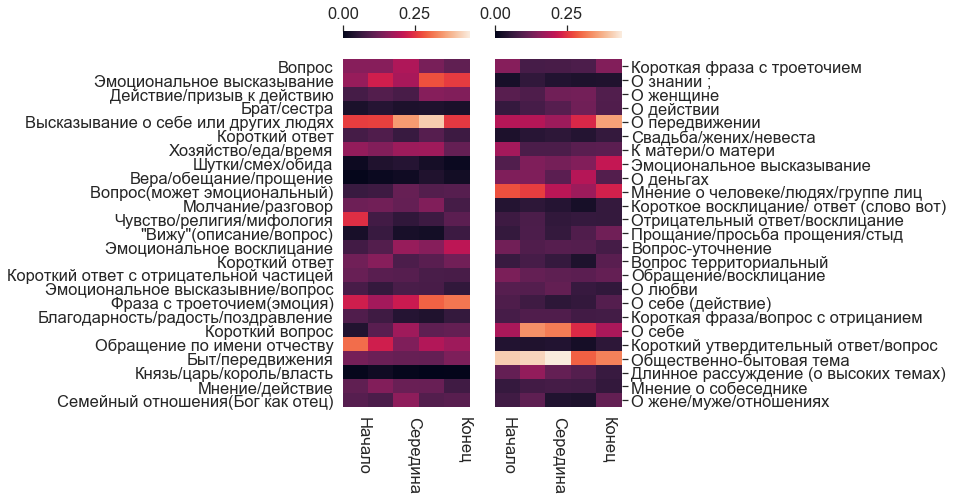

dashkova
['dashkova-toisiokov.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Чувство/религия/мифология
Высказывание о себе или других людях
Высказывание о себе или других людях


<Figure size 432x288 with 0 Axes>

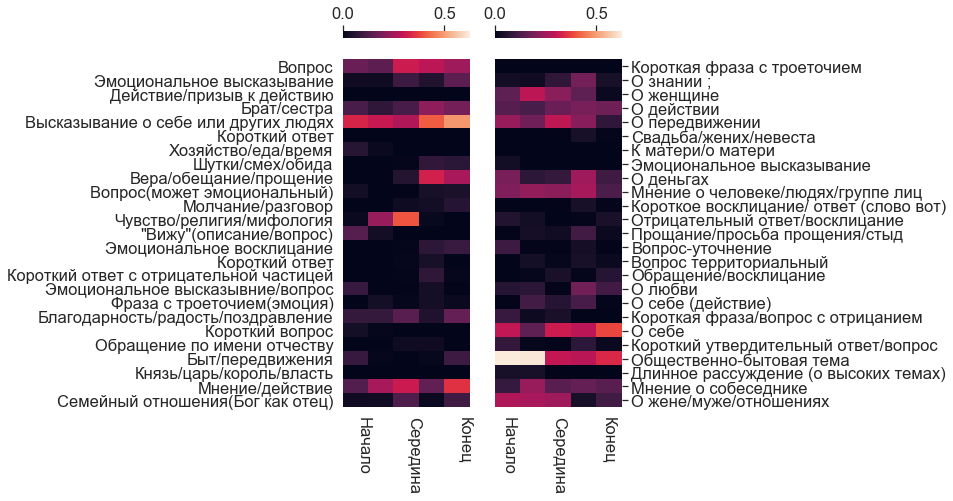

ekaterina
['ekaterina-vtoraja-o-vremja.pkl', 'ekaterina-vtoraja-iz-zhizni-rjurika.pkl']
Князь/царь/король/власть
Князь/царь/король/власть
Князь/царь/король/власть
Общественно-бытовая тема
Князь/царь/король/власть


<Figure size 432x288 with 0 Axes>

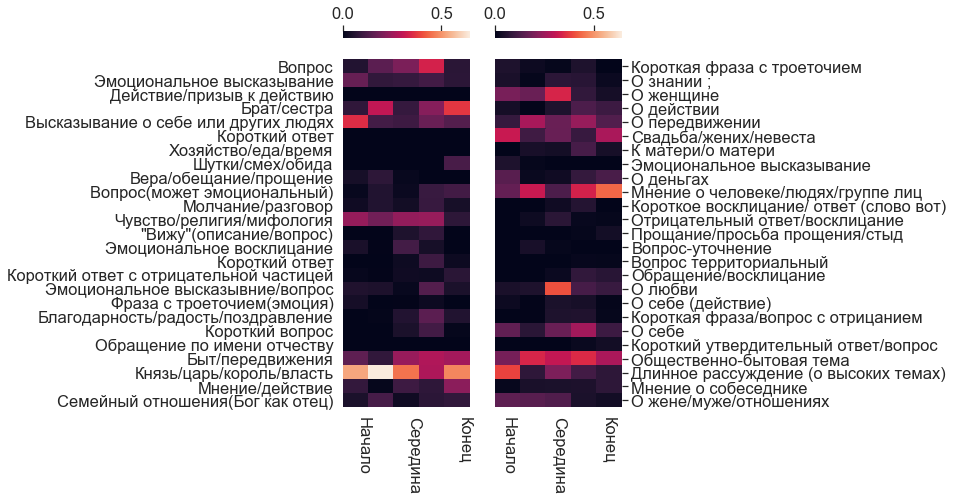

fonvizin
['fonvizin-korion.pkl', 'fonvizin-vybor-guvernera.pkl', 'fonvizin-brigadir.pkl', 'fonvizin-nedorosl.pkl']
Семейный отношения(Бог как отец)
Общественно-бытовая тема
Высказывание о себе или других людях
О себе
Вопрос


<Figure size 432x288 with 0 Axes>

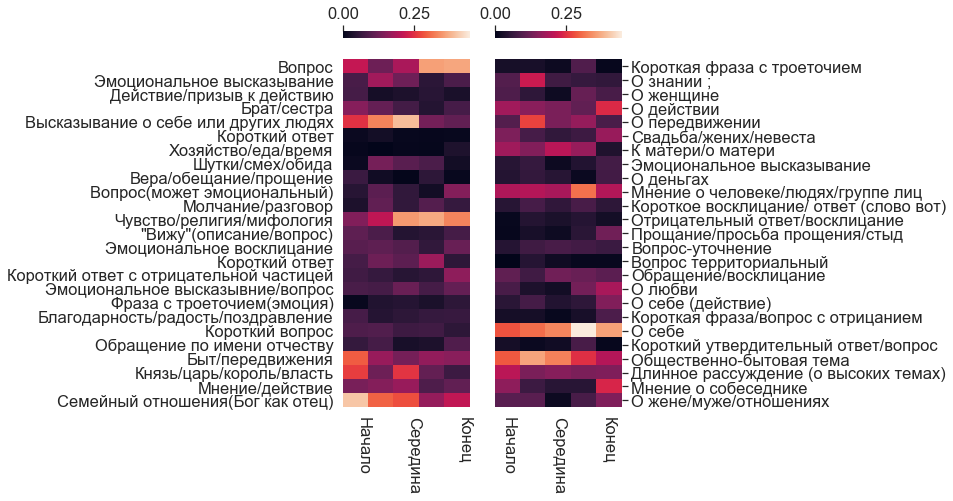

glinka
['glinka-velzen.pkl']
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

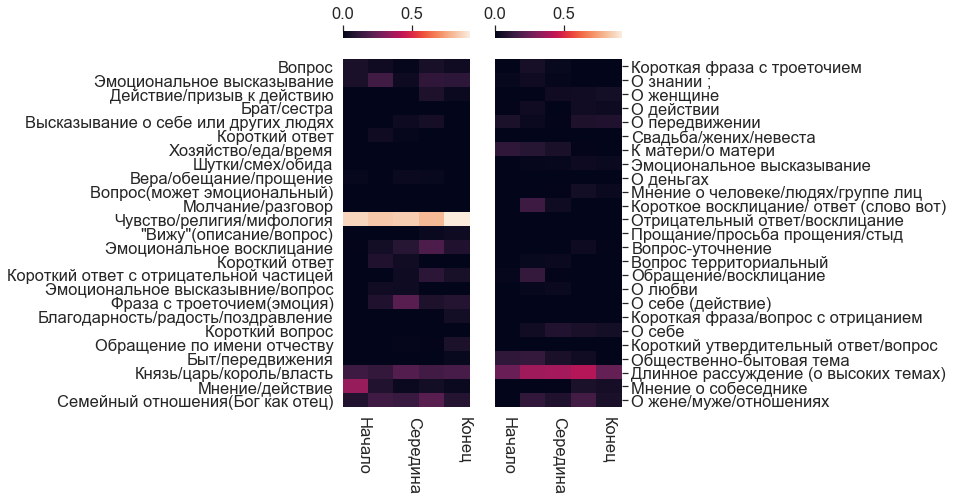

gogol
['gogol-lakeiskaja.pkl', 'gogol-zhenitba.pkl', 'gogol-revizor.pkl', 'gogol-utro-delovogo-cheloveka.pkl', 'gogol-igroki.pkl', 'gogol-tjazhba.pkl']
Общественно-бытовая тема
Мнение о человеке/людях/группе лиц
Вопрос
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

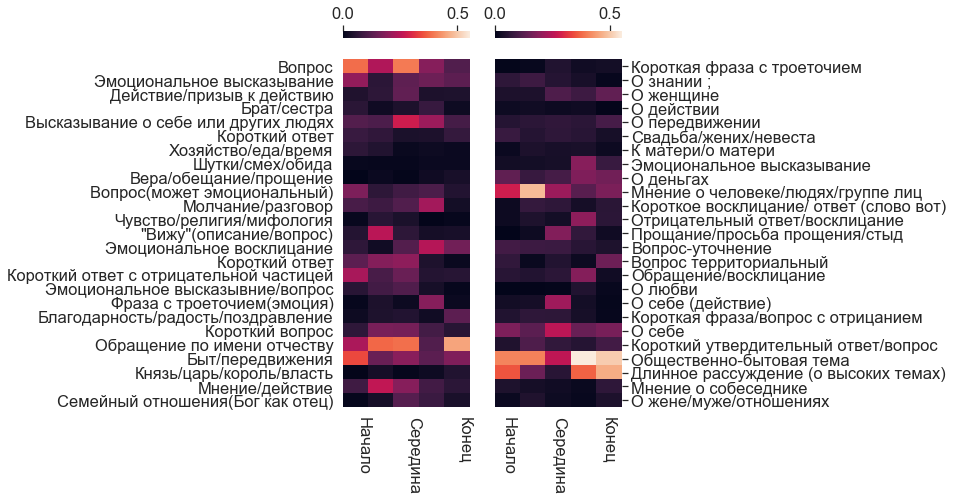

gorky
['gorky-egor-bulychov-i-drugie.pkl', 'gorky-vassa-zheleznova.pkl', 'gorky-na-dne.pkl']
Короткая фраза с троеточием
Фраза с троеточием(эмоция)
Фраза с троеточием(эмоция)
Фраза с троеточием(эмоция)
Фраза с троеточием(эмоция)


<Figure size 432x288 with 0 Axes>

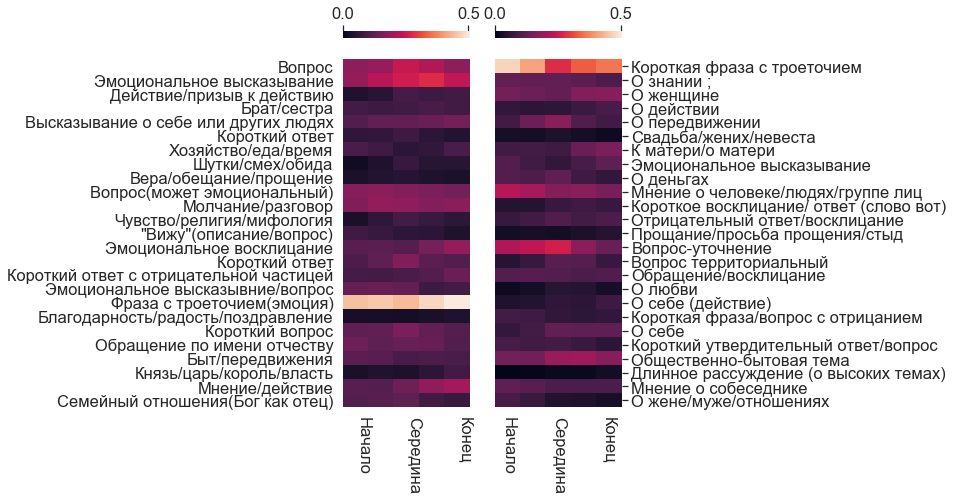

griboyedov
['griboyedov-gore-ot-uma.pkl', 'griboyedov-molodye-suprugi.pkl']
О жене/муже/отношениях
Чувство/религия/мифология
Высказывание о себе или других людях
Мнение/действие
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

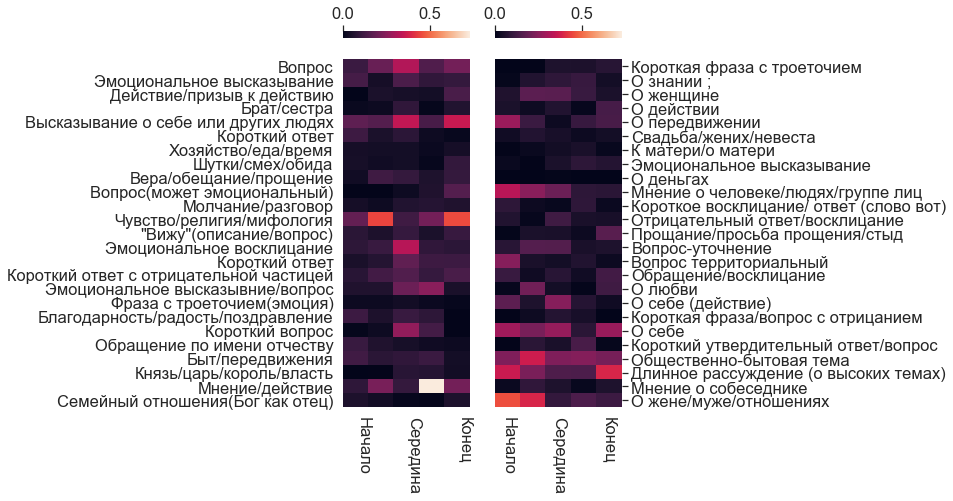

gumilyov
['gumilyov-ditja-allaha.pkl', 'gumilyov-gondla.pkl']
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

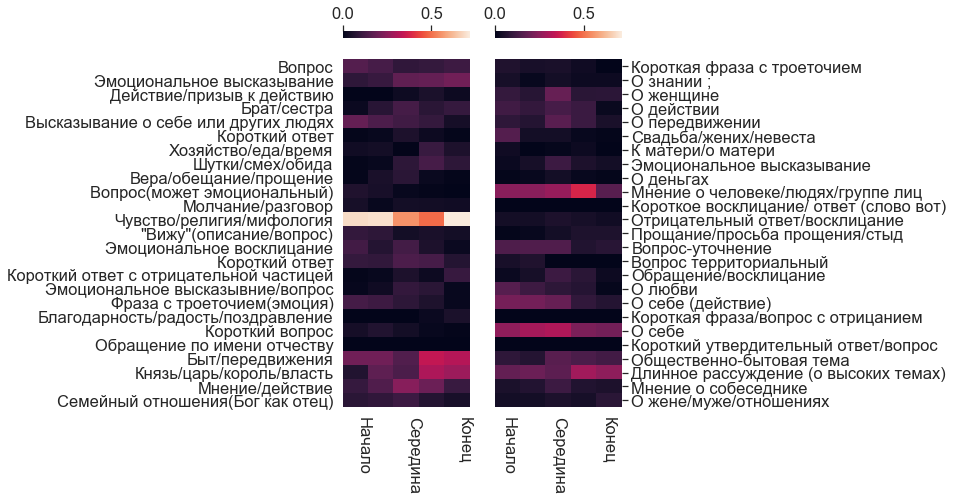

kapnist
['kapnist-antigona.pkl', 'kapnist-yabeda.pkl']
Чувство/религия/мифология
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

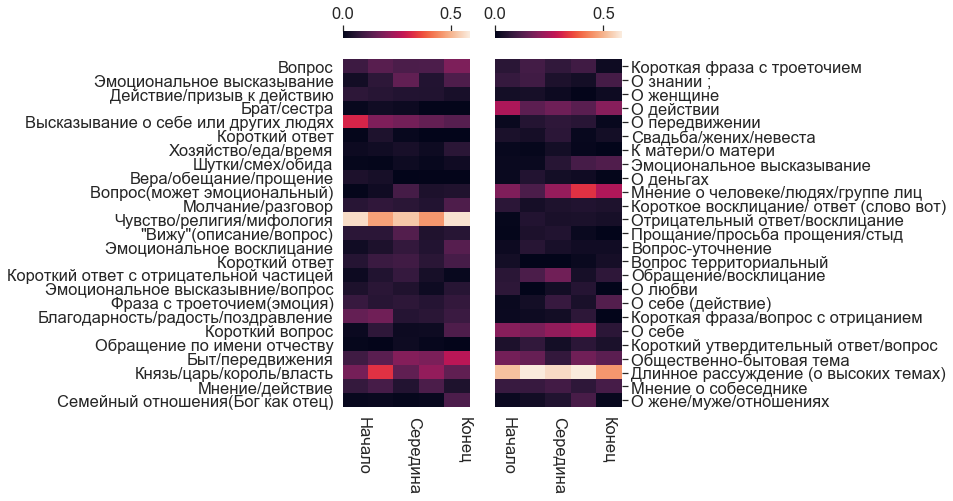

kedrin
['kedrin-rembrandt.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Эмоциональное высказывание
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

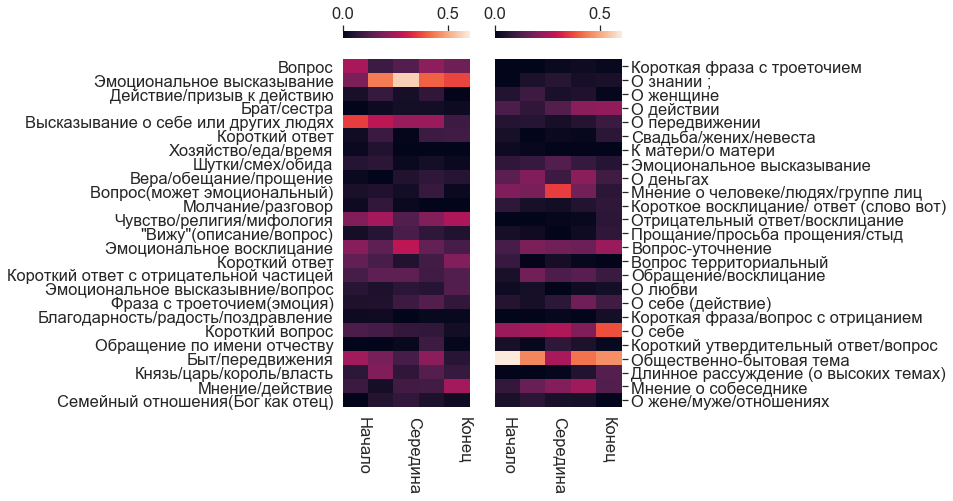

kheraskov
['kheraskov-venecianskaya-monahinya.pkl', 'kheraskov-plamena.pkl', 'kheraskov-osvobozhdennaja-moskva.pkl']
Чувство/религия/мифология
Длинное рассуждение (о высоких темах)
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

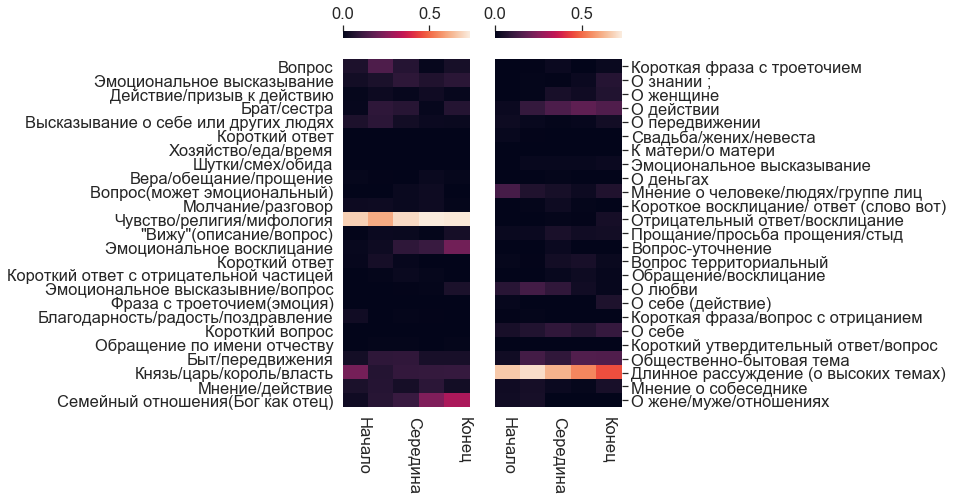

khlebnikov
['khlebnikov-snezhimochka.pkl']
Эмоциональное восклицание
Эмоциональное восклицание
Короткое восклицание/ ответ (слово вот)
Короткий ответ с отрицательной частицей
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

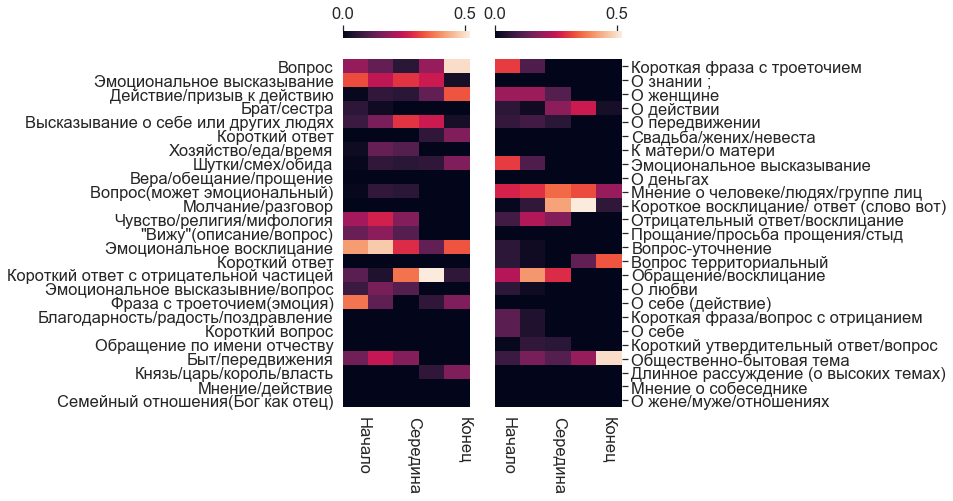

khmelnitsky
['khmelnitsky-vzaimnye-ispytaniya.pkl', 'khmelnitsky-govorun.pkl', 'khmelnitsky-svetskiy-sluchay.pkl', 'khmelnitsky-vozdushnye-zamki.pkl']
Высказывание о себе или других людях
Высказывание о себе или других людях
Чувство/религия/мифология
Фраза с троеточием(эмоция)
Эмоциональное высказывание


<Figure size 432x288 with 0 Axes>

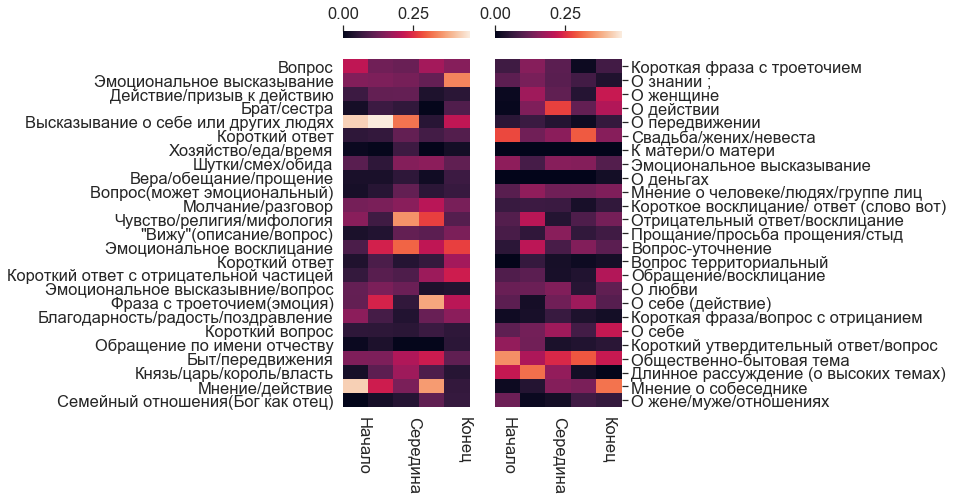

knyazhnin
['knyazhnin-rosslav.pkl', 'knyazhnin-vadim-novgorodskij.pkl', 'knyazhnin-olga.pkl', 'knyazhnin-traur.pkl', 'knyazhnin-neudachnyj-primiritel.pkl', 'knyazhnin-hvastun.pkl', 'knyazhnin-didona.pkl', 'knyazhnin-chudaki.pkl']
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Длинное рассуждение (о высоких темах)


<Figure size 432x288 with 0 Axes>

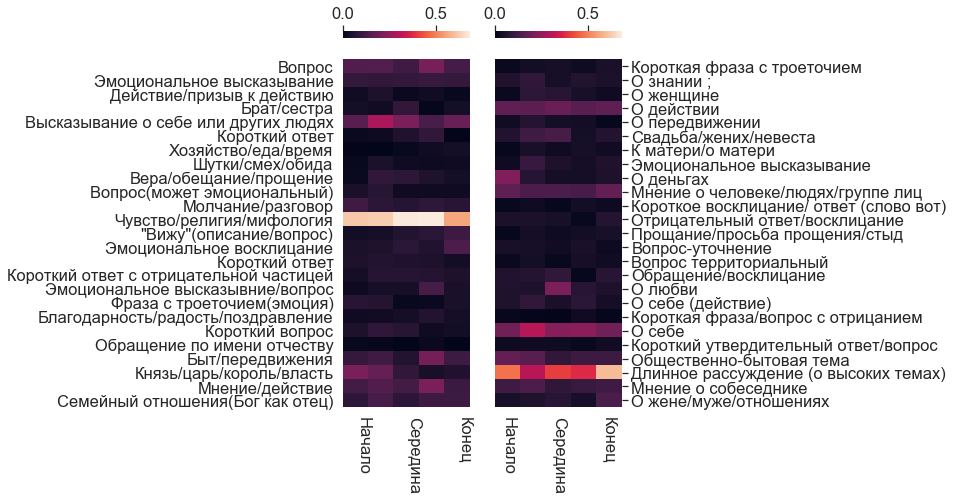

kokoshkin
['kokoshkin-vospitanie.pkl']
Общественно-бытовая тема
Длинное рассуждение (о высоких темах)
Свадьба/жених/невеста
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

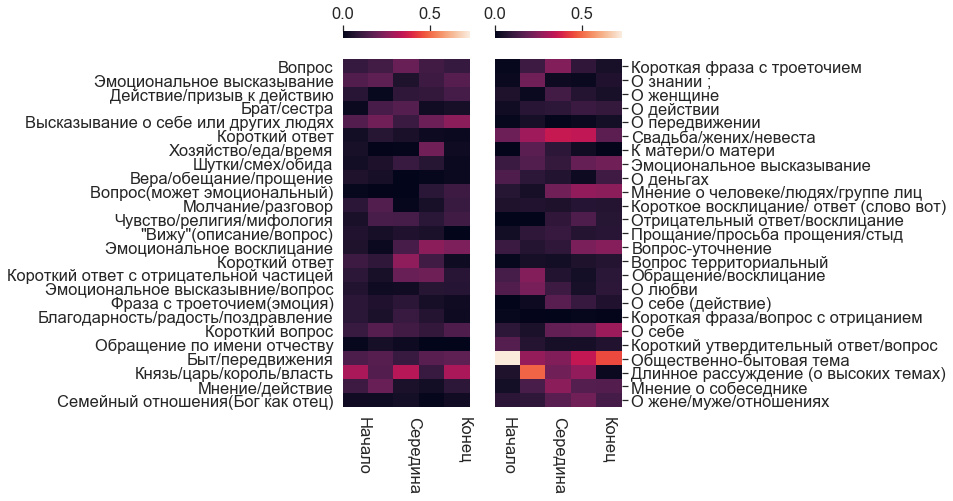

kropotov
['kropotov-fomushka.pkl']
Общественно-бытовая тема
О себе
Длинное рассуждение (о высоких темах)
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

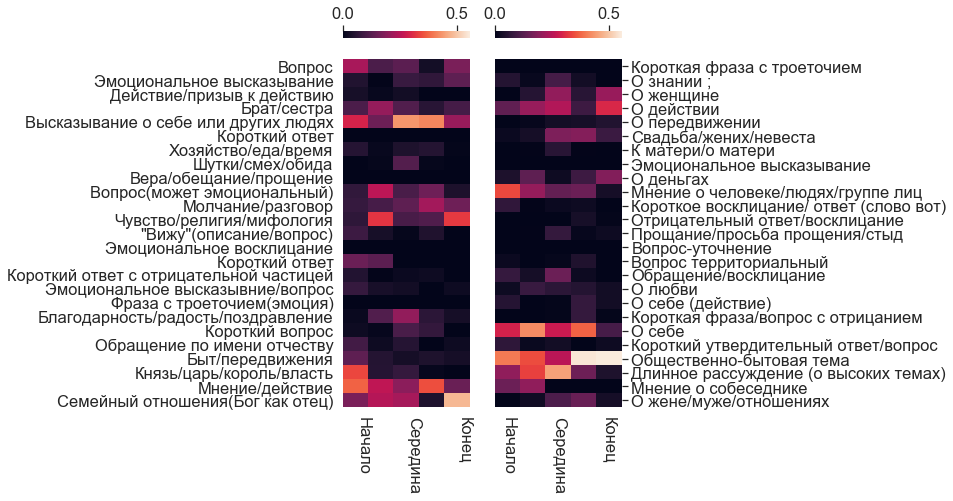

krylov
['krylov-podschipa-ili-trumf.pkl', 'krylov-sonnyj-poroshok.pkl', 'krylov-pirog.pkl', 'krylov-prokazniki.pkl', 'krylov-filomela.pkl', 'krylov-amerikantsy.pkl', 'krylov-modnaja-lavka.pkl', 'krylov-urok-dochkam.pkl']
Общественно-бытовая тема
О себе
Эмоциональное высказывание
Эмоциональное высказывание
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

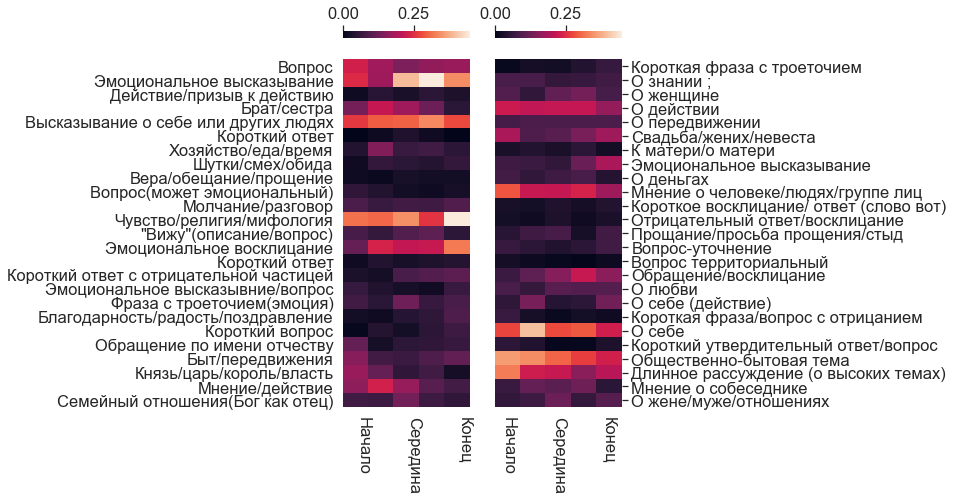

lazhechnikov
['lazhechnikov-okopirovalsya.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Семейный отношения(Бог как отец)
О деньгах
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

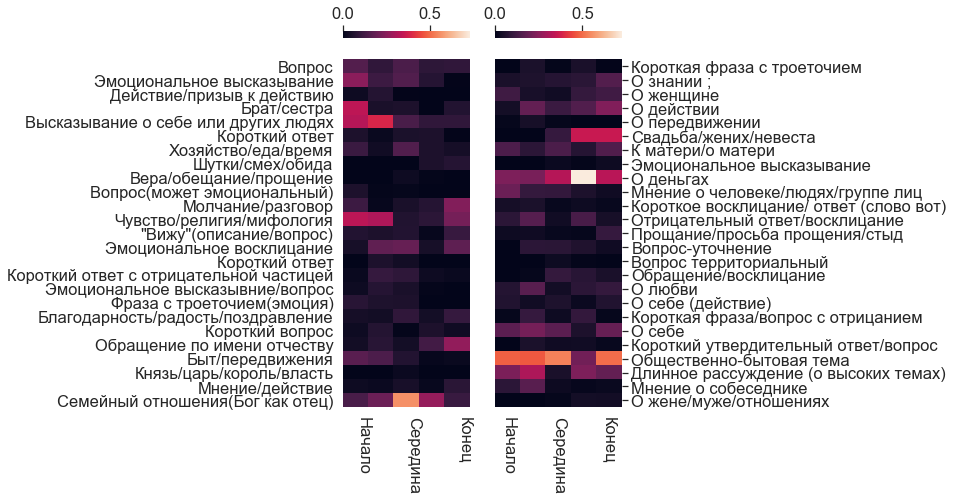

lensky
['lensky-horosha-i-durna.pkl']
Общественно-бытовая тема
Брат/сестра
Свадьба/жених/невеста
Брат/сестра
Брат/сестра


<Figure size 432x288 with 0 Axes>

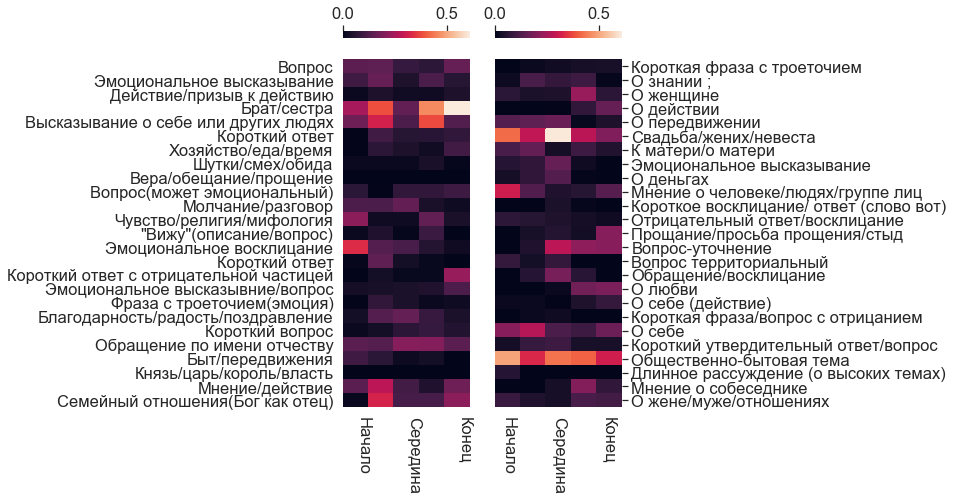

lermontov
['lermontov-strannyj-chelovek.pkl', 'lermontov-menschen-und-leidenschaften.pkl', 'lermontov-maskarad.pkl']
Общественно-бытовая тема
Длинное рассуждение (о высоких темах)
Чувство/религия/мифология
Чувство/религия/мифология
Длинное рассуждение (о высоких темах)


<Figure size 432x288 with 0 Axes>

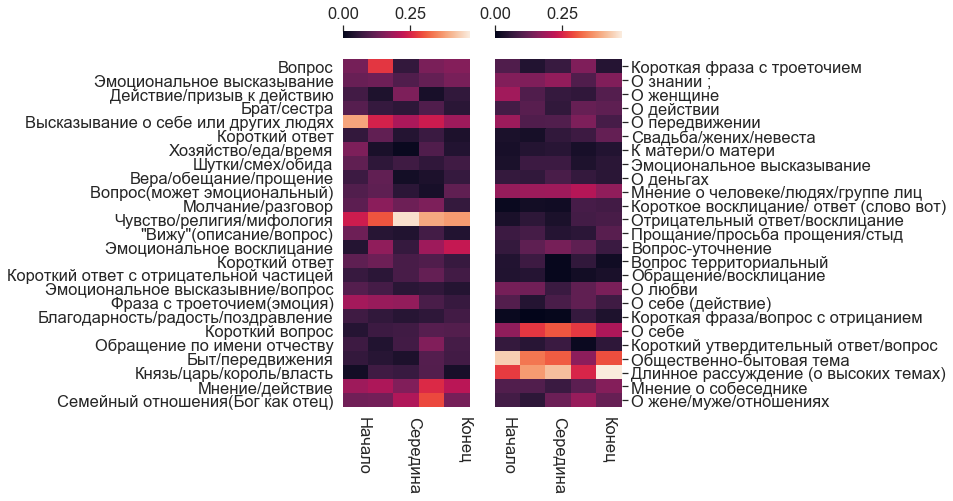

leskov
['leskov-rastochitel.pkl']
Длинное рассуждение (о высоких темах)
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

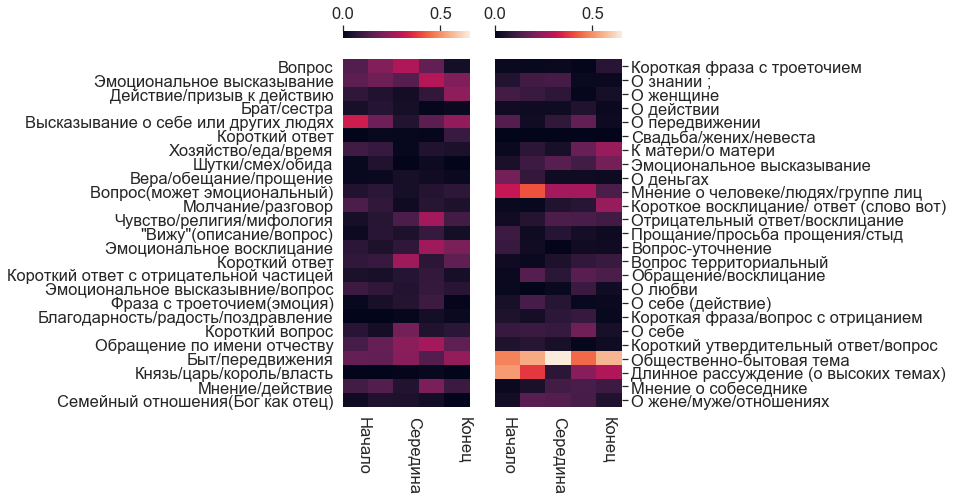

lomonosov
['lomonosov-tamira-i-selim.pkl', 'lomonosov-demofont.pkl']
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)


<Figure size 432x288 with 0 Axes>

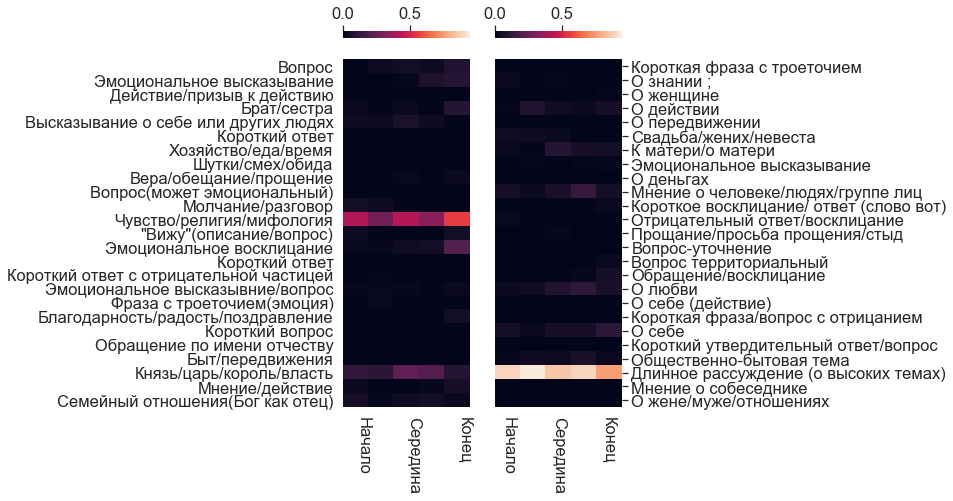

majkov
['majkov-agriopa.pkl', 'majkov-femist-i-ieronima.pkl']
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

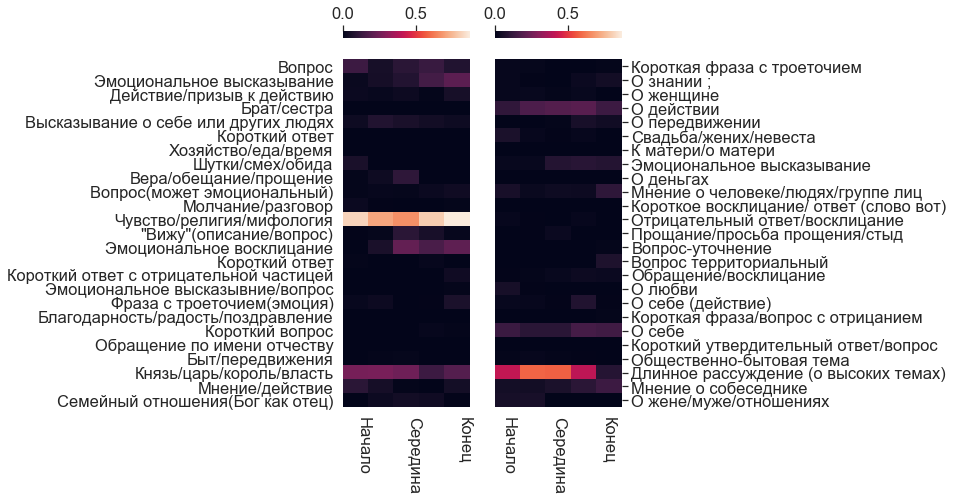

mamin
['mamin-sibirjak-malenkaja-pravda.pkl', 'mamin-sibirjak-zolotopromyshlenniki.pkl']
Обращение по имени отчеству
Обращение по имени отчеству
Обращение по имени отчеству
Обращение по имени отчеству
Обращение по имени отчеству


<Figure size 432x288 with 0 Axes>

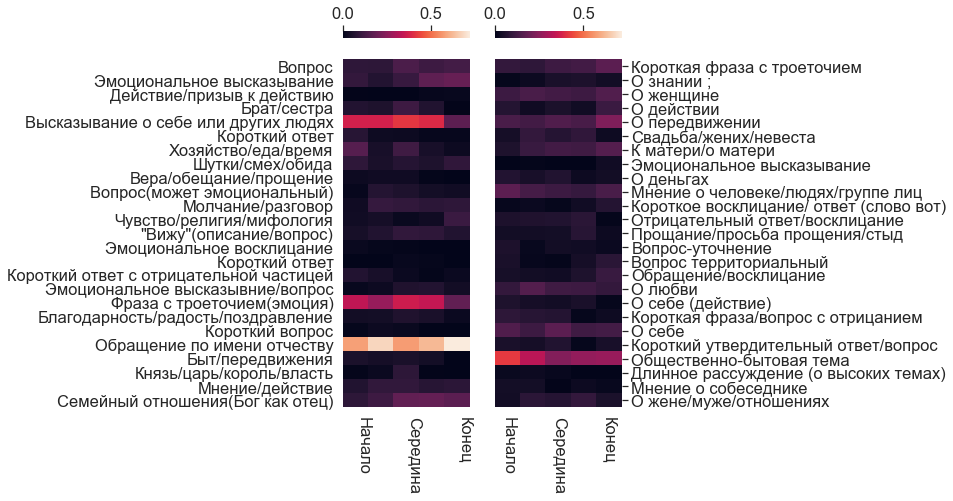

mayakovsky
['mayakovsky-klop.pkl', 'mayakovsky-banja.pkl', 'mayakovsky-misteriya-buff.pkl']
Общественно-бытовая тема
Мнение о человеке/людях/группе лиц
Мнение о человеке/людях/группе лиц
Общественно-бытовая тема
Мнение о человеке/людях/группе лиц


<Figure size 432x288 with 0 Axes>

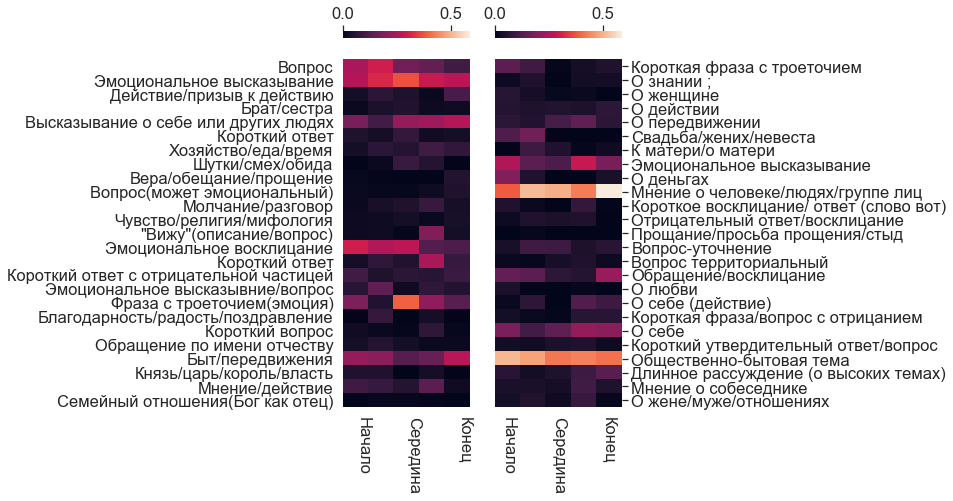

merezhkovsky
['merezhkovsky-pavel-pervyj.pkl']
Эмоциональное высказывание
Князь/царь/король/власть
Фраза с троеточием(эмоция)
Князь/царь/король/власть
Обращение/восклицание


<Figure size 432x288 with 0 Axes>

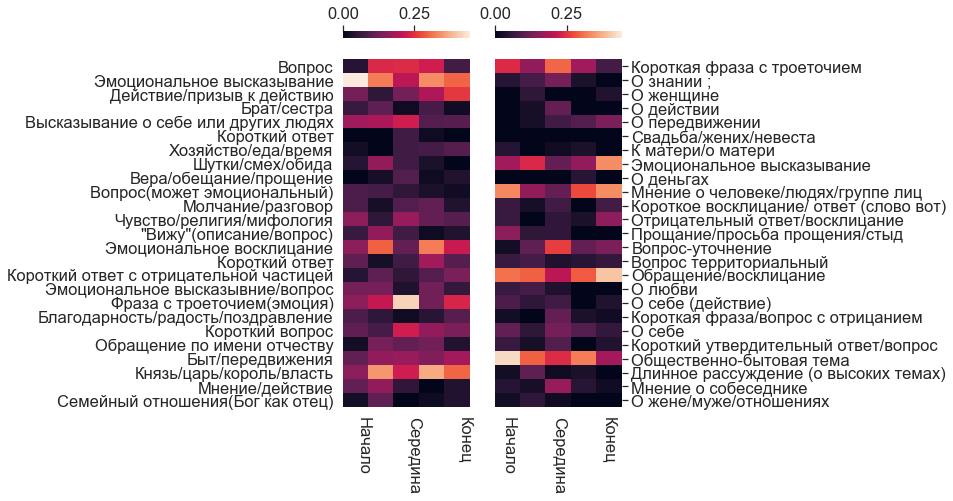

naydyonov
['naydyonov-deti-vanjushina.pkl']
Семейный отношения(Бог как отец)
Мнение/действие
Семейный отношения(Бог как отец)
О передвижении
Вопрос


<Figure size 432x288 with 0 Axes>

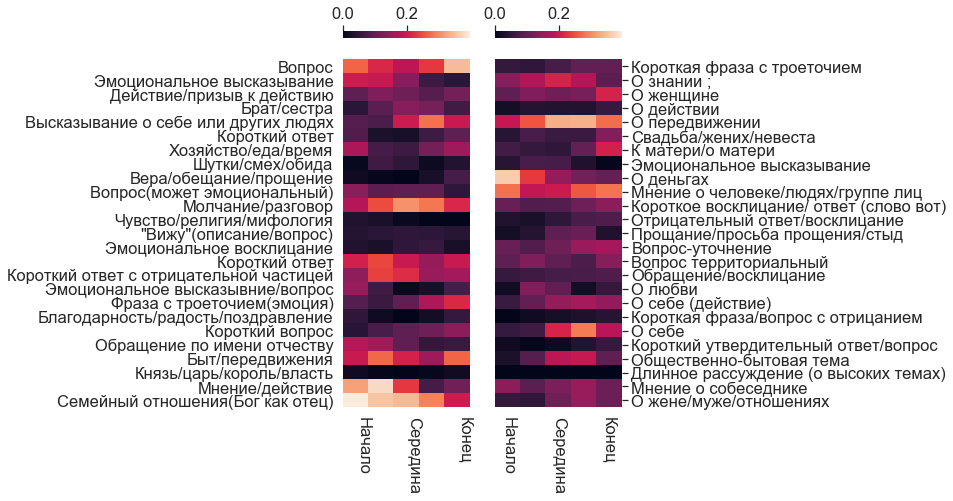

nekrasov
['nekrasov-zabrakovannye.pkl', 'nekrasov-akter.pkl', 'nekrasov-shila-v-meshke-ne-utaish.pkl']
Длинное рассуждение (о высоких темах)
Общественно-бытовая тема
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Эмоциональное высказывание


<Figure size 432x288 with 0 Axes>

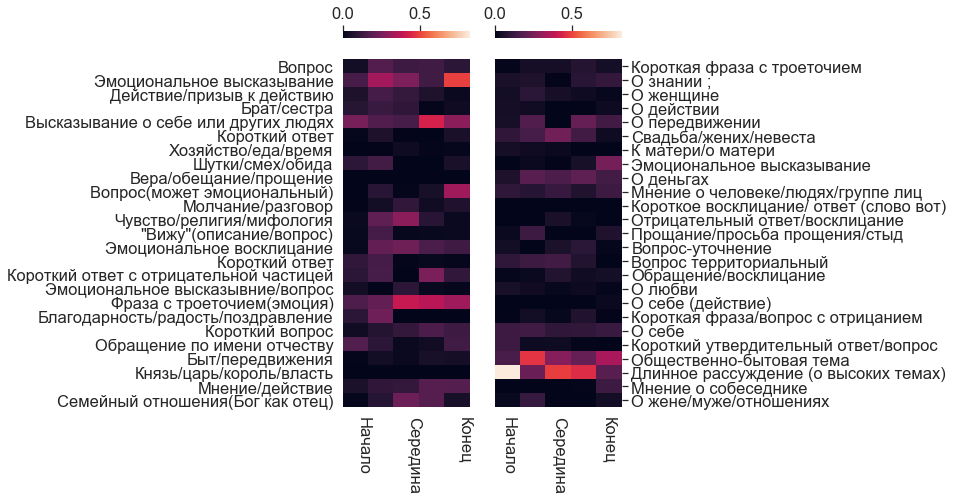

nikolev
['nikolev-samolyubivyj-stihotvorec.pkl']
Чувство/религия/мифология
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Общественно-бытовая тема
Эмоциональное восклицание


<Figure size 432x288 with 0 Axes>

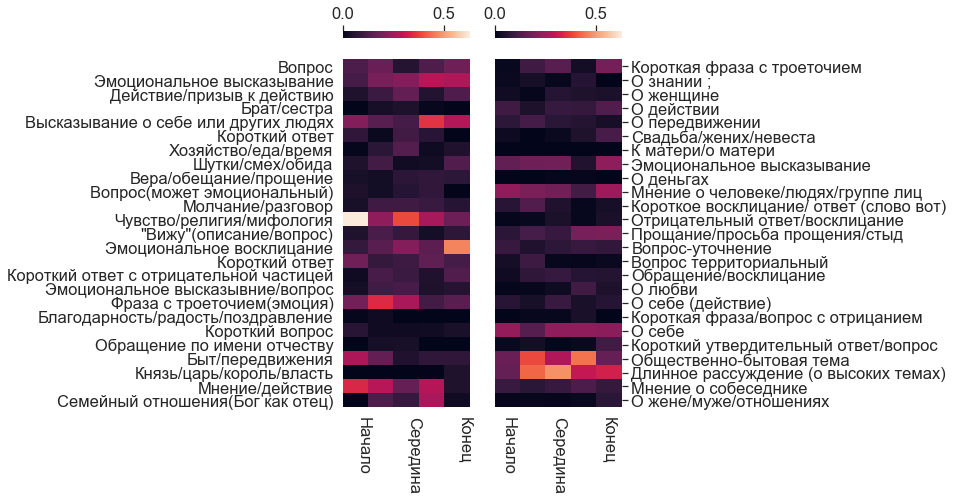

ostrovsky
['ostrovsky-bednaja-nevesta.pkl', 'ostrovsky-svoi-sobaki-gryzutsya-chuzhaya-ne-pristavaj.pkl', 'ostrovsky-trudovoj-hleb.pkl', 'ostrovsky-greh-da-beda-na-kogo-ne-zhivet.pkl', 'ostrovsky-ne-v-svoi-sani-ne-sadis.pkl', 'ostrovsky-puchina.pkl', 'ostrovsky-pozdnyaya-lyubov.pkl', 'ostrovsky-bez-viny-vinovatye.pkl', 'ostrovsky-na-bojkom-meste.pkl', 'ostrovsky-na-vsyakogo-mudreca-dovolno-prostoty.pkl']
Мнение о человеке/людях/группе лиц
Высказывание о себе или других людях
Мнение о человеке/людях/группе лиц
Мнение о человеке/людях/группе лиц
Высказывание о себе или других людях


<Figure size 432x288 with 0 Axes>

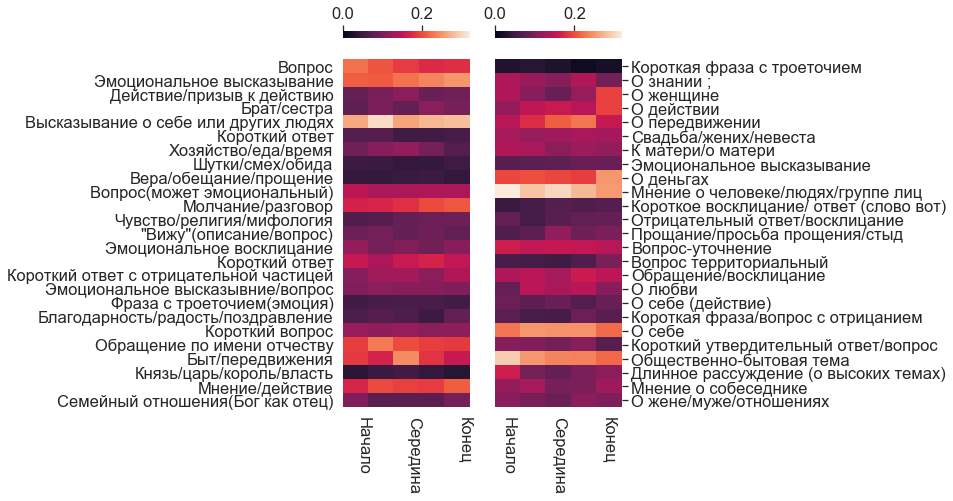

ozerov
['ozerov-dmitrij-donskoj.pkl']
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

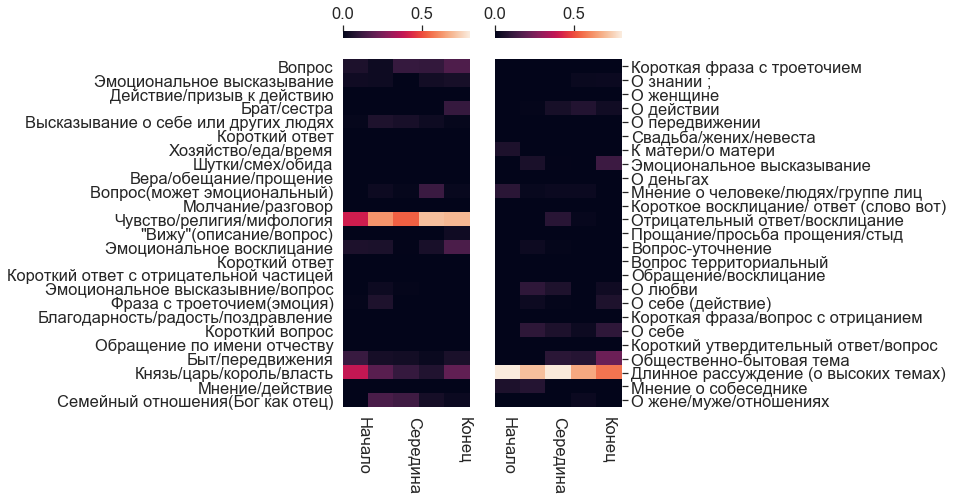

petrov
['petrov-ostrov-mira.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Обращение/восклицание
Эмоциональное восклицание


<Figure size 432x288 with 0 Axes>

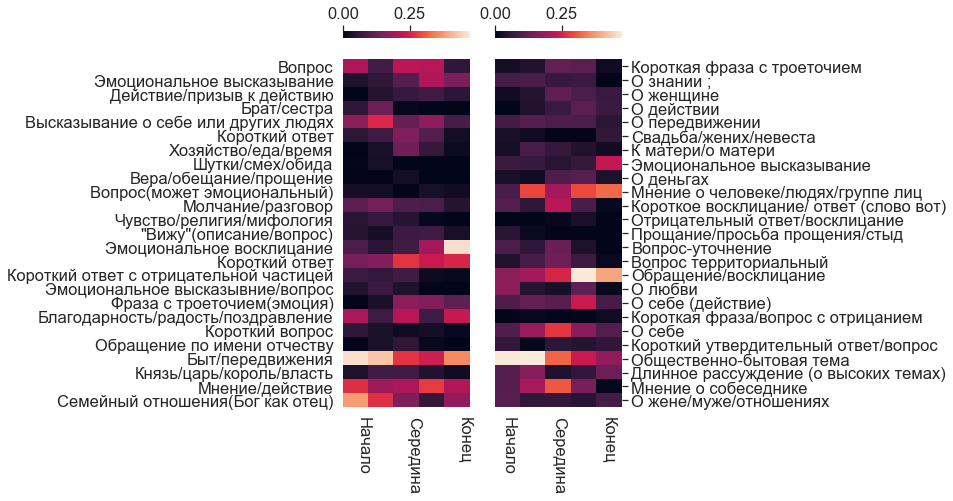

pisarev
['pisarev-naslednica.pkl', 'pisarev-lukavin.pkl', 'pisarev-poezdka-v-kronshtadt.pkl']
Высказывание о себе или других людях
Высказывание о себе или других людях
Высказывание о себе или других людях
Высказывание о себе или других людях
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

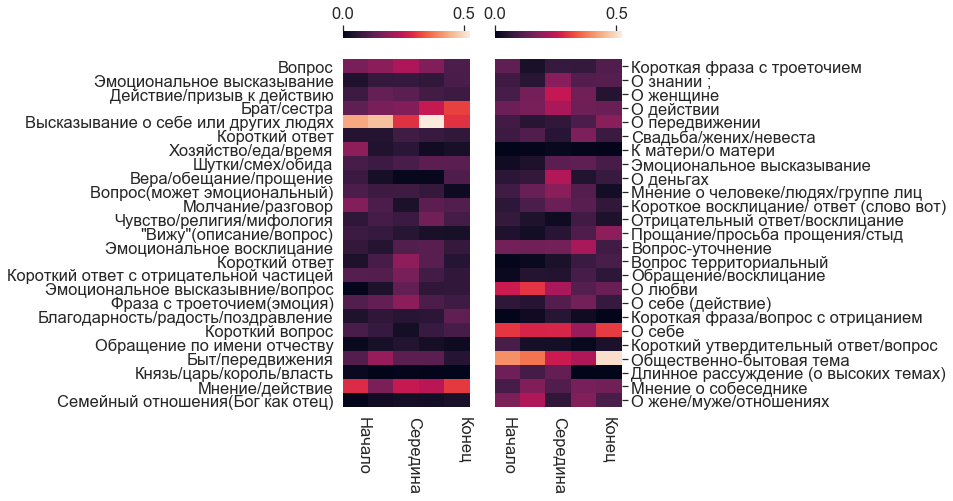

pisemskij
['pisemskij-gorkaja-sudbina.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Эмоциональное высказывание
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

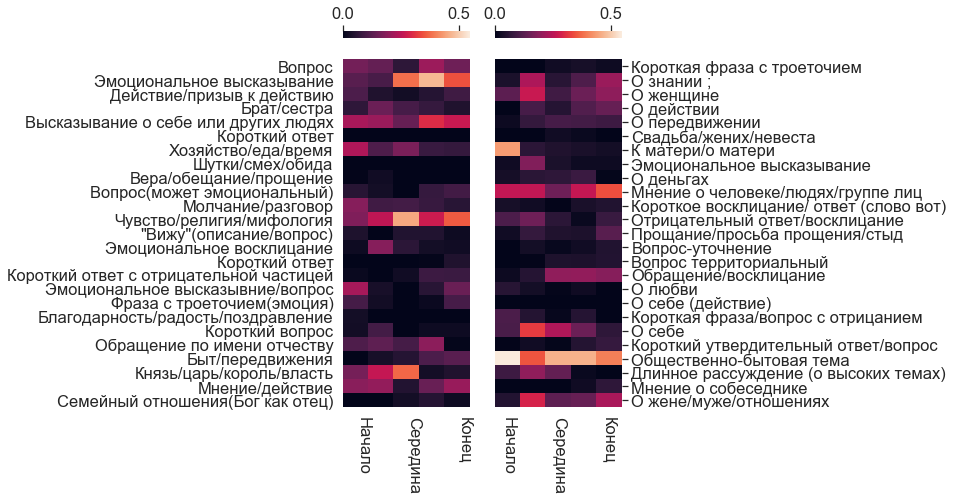

plavilshchikov
['plavilshchikov-sgovor-kutejkina.pkl', 'plavilshchikov-ermak-pokoritel-sibiri.pkl']
Длинное рассуждение (о высоких темах)
Семейный отношения(Бог как отец)
О действии
Свадьба/жених/невеста
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

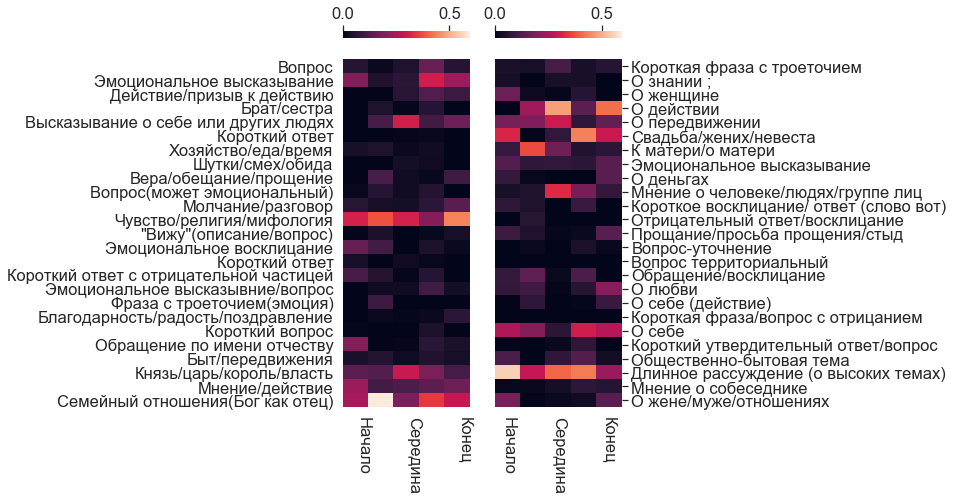

prutkov
['prutkov-fantaziya.pkl', 'prutkov-chereposlov-sirech-frenolog.pkl', 'prutkov-blondy.pkl', 'prutkov-srodstvo-mirovyh-sil.pkl']
Общественно-бытовая тема
О себе
О себе
Эмоциональное высказывание
Эмоциональное высказывание


<Figure size 432x288 with 0 Axes>

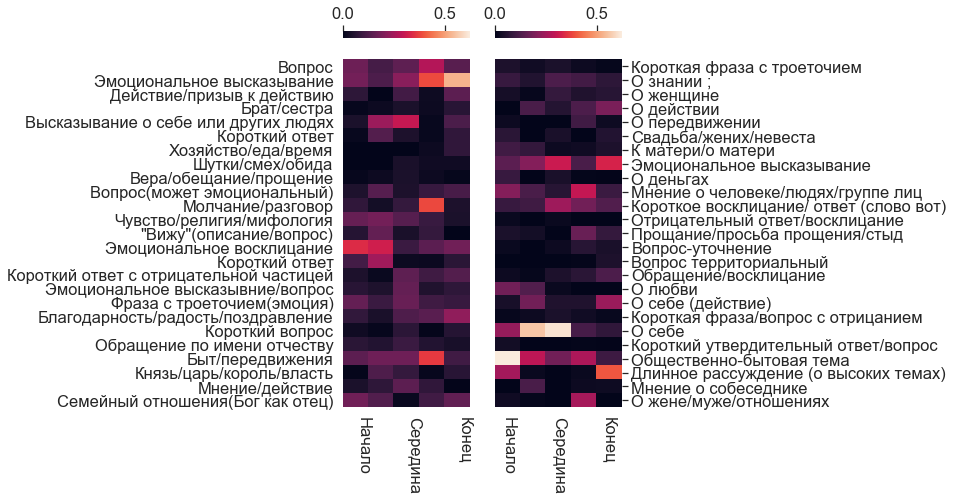

pushkin
['pushkin-boris-godunov.pkl', 'pushkin-kamenniy-gost.pkl', 'pushkin-rusalka.pkl', 'pushkin-skupoj-rytsar.pkl']
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)
Длинное рассуждение (о высоких темах)


<Figure size 432x288 with 0 Axes>

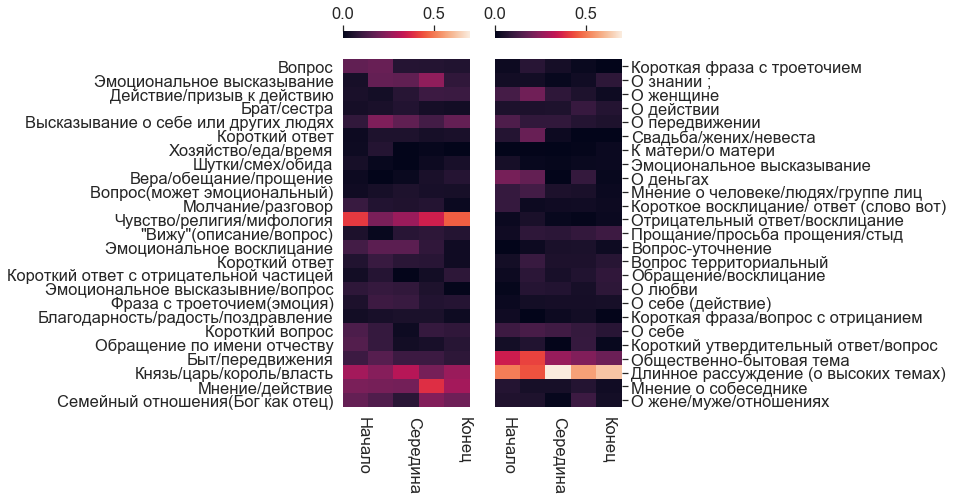

rostopchina
['rostopchina-neludimka.pkl']
Эмоциональное высказывание
Высказывание о себе или других людях
Высказывание о себе или других людях
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

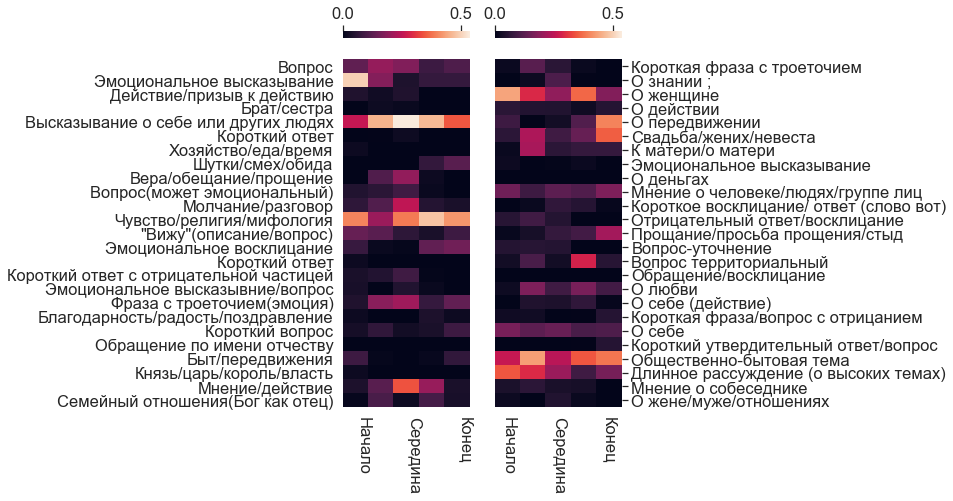

saltykov
['saltykov-shchedrin-smert-pazuhina.pkl']
Обращение по имени отчеству
Обращение по имени отчеству
Обращение по имени отчеству
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

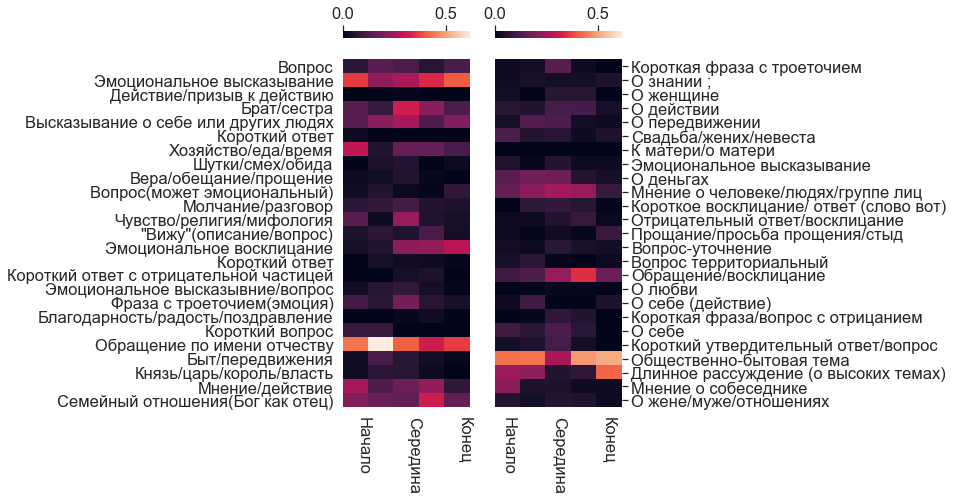

shakhovskoy
['shakhovskoy-ne-lubo-ne-slushai.pkl', 'shakhovskoy-pustodomy.pkl', 'shakhovskoy-svoya-semya.pkl', 'shakhovskoy-urok-koketkam.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
О себе


<Figure size 432x288 with 0 Axes>

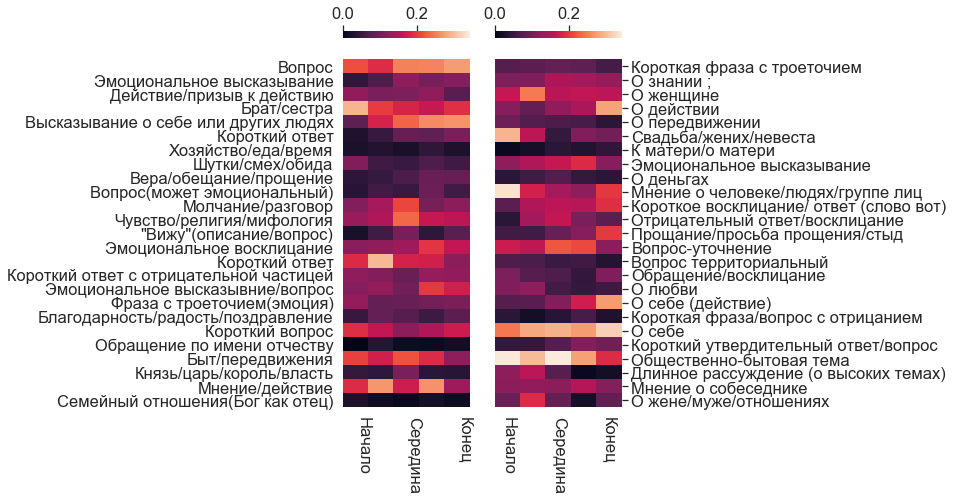

sollogub
['sollogub-chinovnik.pkl']
Вопрос
Высказывание о себе или других людях
Общественно-бытовая тема
Высказывание о себе или других людях
О себе


<Figure size 432x288 with 0 Axes>

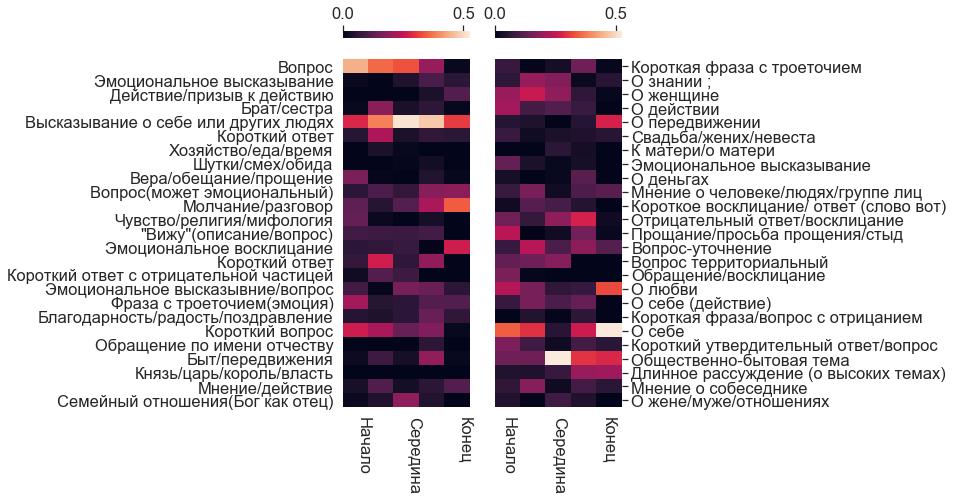

sudovshchikov
['sudovshchikov-neslyhannoe-divo.pkl']
Свадьба/жених/невеста
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

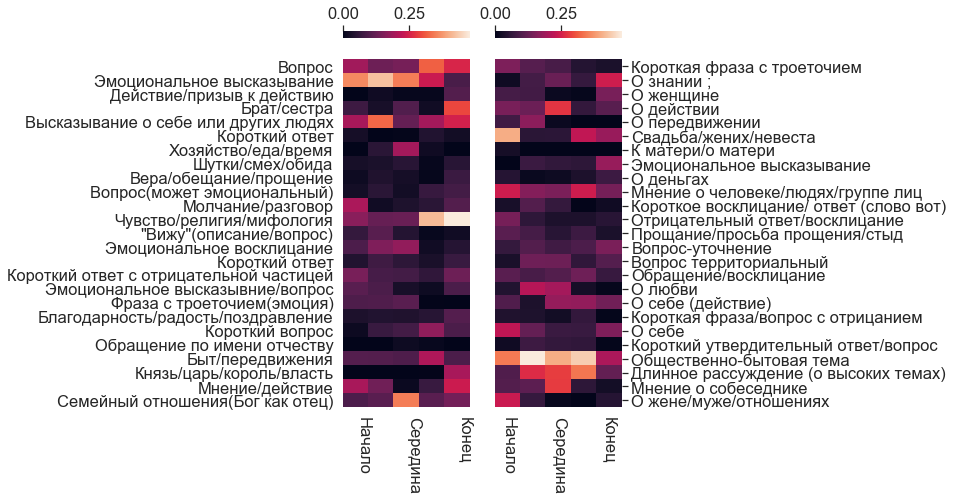

sukhovo
['sukhovo-kobylin-smert-tarelkina.pkl', 'sukhovo-kobylin-svadba-krechinskogo.pkl', 'sukhovo-kobylin-delo.pkl']
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема
Общественно-бытовая тема


<Figure size 432x288 with 0 Axes>

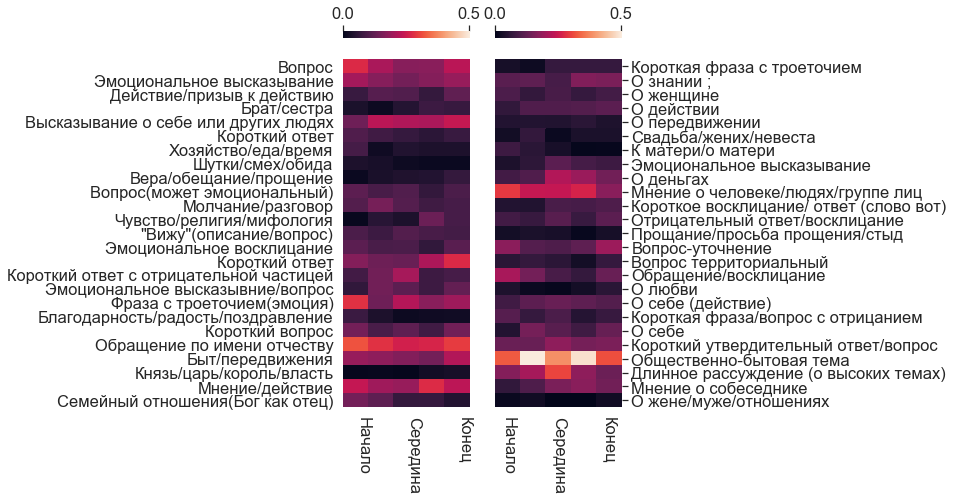

sumarokov
['sumarokov-opekun.pkl', 'sumarokov-pridanoe-obmanom.pkl', 'sumarokov-gamlet.pkl', 'sumarokov-vzdorschitsa.pkl', 'sumarokov-horev.pkl', 'sumarokov-dimitrij-samozvanets.pkl', 'sumarokov-semira.pkl', 'sumarokov-artistona.pkl', 'sumarokov-rogonosets-po-voobrazheniju.pkl', 'sumarokov-chudovischi.pkl']
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология
Чувство/религия/мифология


<Figure size 432x288 with 0 Axes>

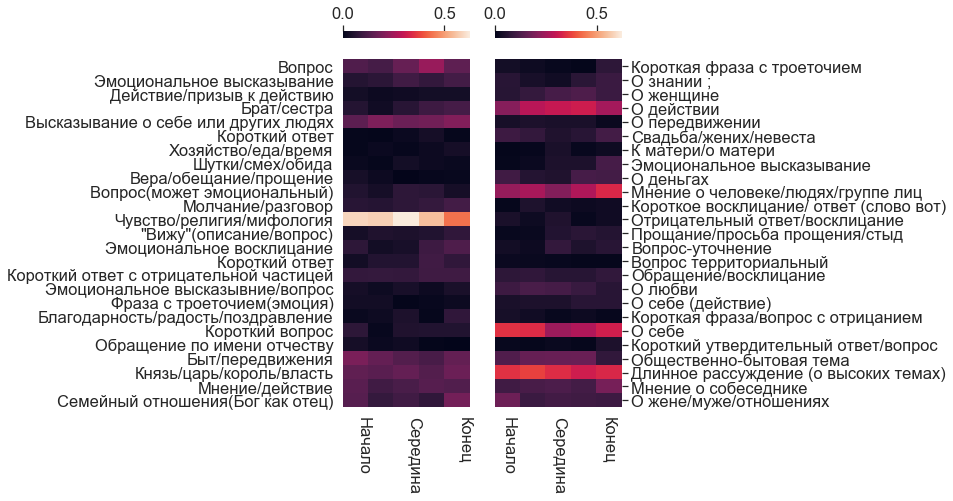

tolstoy
['tolstoy-zhivoy-trup.pkl', 'tolstoy-tsar-fedor-ioannovich.pkl', 'tolstoy-smert-ioanna-groznogo.pkl', 'tolstoy-vlast-tmy.pkl', 'tolstoy-tsar-boris.pkl']
Князь/царь/король/власть
Князь/царь/король/власть
Князь/царь/король/власть
Князь/царь/король/власть
Князь/царь/король/власть


<Figure size 432x288 with 0 Axes>

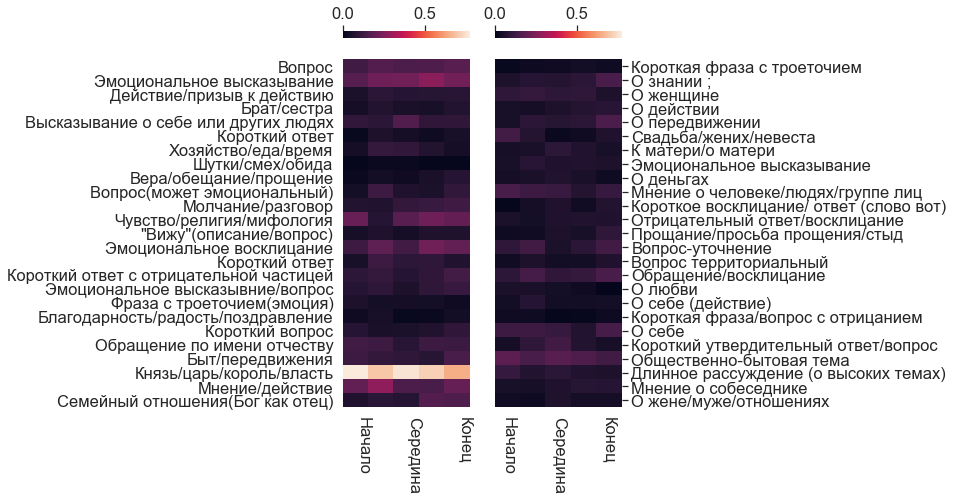

tretyakov
['tretyakov-protivogazy.pkl']
Быт/передвижения
Быт/передвижения
Быт/передвижения
Короткий ответ
Короткий ответ


<Figure size 432x288 with 0 Axes>

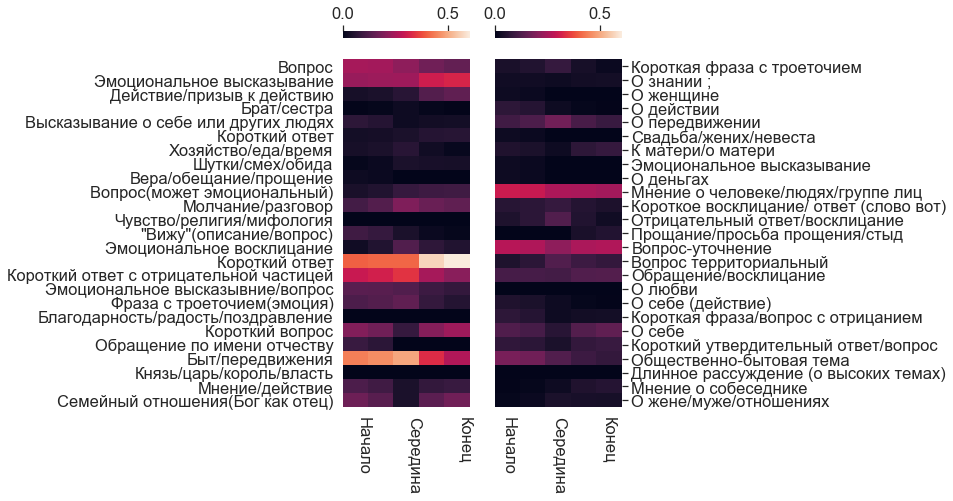

turgenev
['turgenev-mesjats-v-derevne.pkl', 'turgenev-holostjak.pkl', 'turgenev-neostorozhnost.pkl', 'turgenev-zavtrak-u-predvoditelja.pkl', 'turgenev-provintsialka.pkl']
Высказывание о себе или других людях
Обращение по имени отчеству
Обращение по имени отчеству
Высказывание о себе или других людях
Высказывание о себе или других людях


<Figure size 432x288 with 0 Axes>

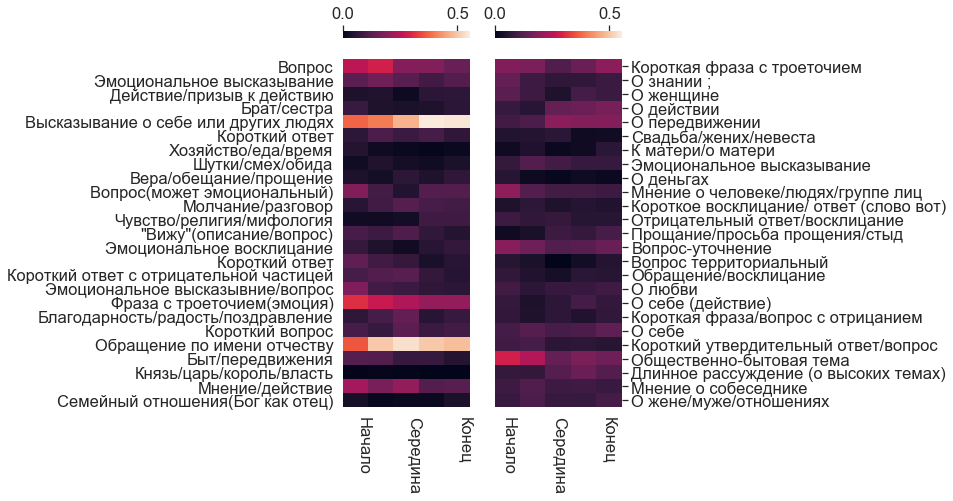

zagoskin
['zagoskin-blagorodnyj-teatr.pkl']
Общественно-бытовая тема
Эмоциональное восклицание
Общественно-бытовая тема
Общественно-бытовая тема
Эмоциональное восклицание


<Figure size 432x288 with 0 Axes>

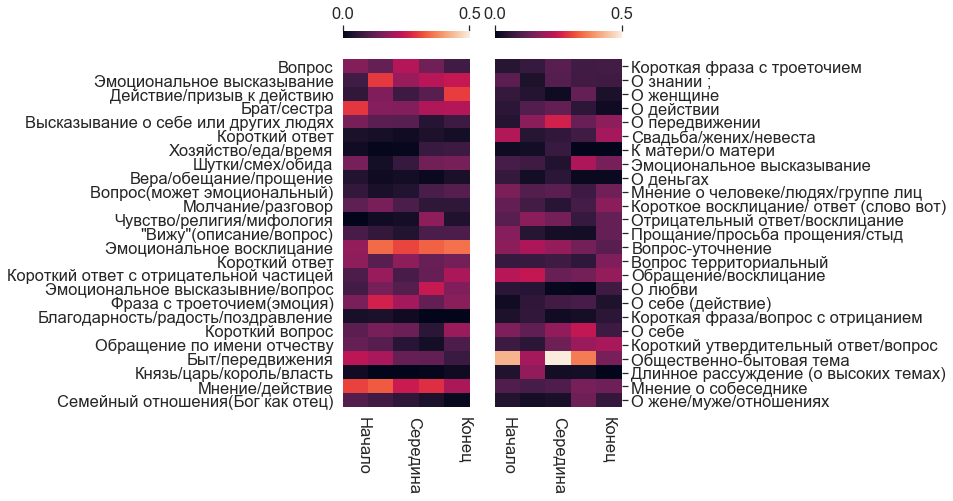

<Figure size 432x288 with 0 Axes>

In [414]:
sns.set(font_scale=1.5)
for author in sorted(authors_drama_pics_fc):
    print(author)
    print(authors_drama_names[author][:10])
    for theme in [cluster_names[np.argmax(line)] for line in authors_drama_pics_fc[author]]:
        print(theme)
    fig, axes = plt.subplots(1, 2)
    fig.set_size_inches(5, 8)
    cl_names_list = [v for _, v in sorted(cluster_names.items(), key=lambda item: item[0])]
    max_value = np.max(normalize(authors_drama_pics_fc[author]))
    hm = sns.heatmap(np.transpose(normalize(authors_drama_pics_fc[author]))[:25],
                yticklabels=cl_names_list[:25],
                xticklabels=['Начало', '', 'Середина', '' , 'Конец'], ax=axes[0], 
                vmin=.0, vmax=max_value, cbar_kws = dict(use_gridspec=False,location="top"))
    hm.set_xticklabels(hm.get_xticklabels(), rotation=270, horizontalalignment='left')
    hm.set_yticklabels(hm.get_yticklabels(), rotation=0, horizontalalignment='right')
    
    hm = sns.heatmap(np.transpose(normalize(authors_drama_pics_fc[author]))[25:],
                yticklabels=cl_names_list[25:],
                xticklabels=['Начало', '', 'Середина', '' , 'Конец'], ax=axes[1],
                vmin=.0, vmax=max_value, cbar_kws = dict(use_gridspec=False,location="top"))
    hm.set_xticklabels(hm.get_xticklabels(), rotation=270, horizontalalignment='center')
    hm.set_yticklabels(hm.get_yticklabels(), rotation=0, horizontalalignment='left')
    hm.yaxis.tick_right()
    plt.show()
    plt.clf()

In [ ]:
sents_sets_for_clusters = {}

for ngram, sents_sets in tqdm(ngrams_sents.items()):
    if ngram != '':
        huge_cluster = ngram_to_clusters[ngram]
        if sents_sets_for_clusters.get(huge_cluster) is None:
            sents_sets_for_clusters[huge_cluster] = sents_sets
        else:
            sents_sets_for_clusters[huge_cluster] = sents_sets_for_clusters[huge_cluster] + sents_sets

In [ ]:
# ngram_clusters_names[49] = 'Диалоги с территориальными вопросами (о движении/местонахождении)'

In [ ]:
clusters_quality = {}
for curr_cluster in [49, 28, 1]:
    cluster_sents = sents_sets_for_clusters[curr_cluster]
    curr_clust_q = clusters_quality.get(curr_cluster, {'good': 0, 'bad': 0, 'percent': 0})
    print (curr_clust_q)
    for i, sent in enumerate(random.choices(cluster_sents, k=100)):
        print(ngram_clusters_names[curr_cluster] + '_' + str(i))
        print('\n')
        print('\n'.join(sent))
        goodness = int(input())
        if goodness == 1:
            curr_clust_q['good'] += 1
        else:
            curr_clust_q['bad'] += 1
        curr_clust_q['percent'] = curr_clust_q['good'] / (curr_clust_q['good'] + curr_clust_q['bad'])
        print(curr_clust_q)
        print('=================================')
        clusters_quality[curr_cluster] = curr_clust_q
        if curr_clust_q['good'] + curr_clust_q['bad'] > 100:
            break
        

clusters_quality

In [268]:
ngram_clusters_names[49]

'Диалоги с территориальными вопросами (о движении/местонахождении)'

{'Свадьба/жених/невеста': 0.310515873015873,
 'Длинная фраза про общество/страну/общественное положение/работу/быт': 0.29484126984126985,
 'О деньгах': 0.2466269841269841,
 'Эмоциональное высказывание': 0.13055555555555556,
 'Короткая фраза с троеточием': 0.1400793650793651,
 'Вопрос': 0.10119047619047618,
 'О жене/муже/отношениях': 0.08829365079365079,
 'Эмоциональное восклицание': 0.08571428571428572,
 'Фраза с троеточием(эмоция)': 0.07896825396825397,
 'Обращение по имени отчеству': 0.07103174603174603,
 'О любви': 0.06805555555555556,
 'О женщине': 0.06349206349206349,
 'О действии': 0.03412698412698413,
 'Хозяйство/еда/время': 0.029761904761904764,
 'Мнение о человеке/людях/группе лиц': 0.025,
 'Быт/передвижения': 0.014484126984126986,
 'Мнение/действие': 0.014285714285714287,
 'Эмоциональное высказывние/вопрос': 0.00892857142857143,
 'Князь/царь/король/власть': 0.006944444444444445,
 'О себе': 0.0,
 'Молчание/разговор': 0.0}

In [ ]:
for cl in clusters_quality:
    print(ngram_clusters_names[cl])
    print(clusters_quality[cl])
    print('\n')

In [ ]:
# {'blok-neznakomka_6_0_60': 117,
#  'blok-neznakomka_6_1_76': 118,
#  'blok-neznakomka_6_2_55': 119,
#  'blok-korol-na-ploschadi_30_0_92': 590,
#  'blok-korol-na-ploschadi_30_1_86': 591,
#  'blok-korol-na-ploschadi_30_2_95': 592,
#  'blok-balaganchik_168_0_77': 3730}

def final_cluster_text(per_text, cluster_model, cluster_seq_emb, ngram_kmeans, cluster_names={}, sent_to_vector_dict={}):
    output = []
    all_clusters = []
    for person, sent in per_text:
        if sent in sent_to_vector_dict:
            sent_vec = sent_to_vector_dict[sent]
        else:
            sent_vec = get_sent_vector(sent)
        if sent_vec is not None:
            cluster =  clust_model_kmeans.predict([sent_vec])[0]
            sents = {sent: cluster_names.get(cluster, str(cluster))}
            output.append((person, sents))
            all_clusters.append(cluster)
    ngrams = ngrams_from_vec(all_clusters, n=3)
    ngram_vecs = [cluster_seq_emb.predict([[[clust_model_kmeans.cluster_centers_[cl] for cl in ngram]]])[0][-1] for ngram in ngrams]
    huge_clusters_in_this_text = ngram_kmeans.predict(ngram_vecs)
    return output, all_clusters, huge_clusters_in_this_text

parsed_text, _, huge_clusters = final_cluster_text(dramas_texts[96][0], 
                                            clust_model_kmeans,
                                            cluster_seq_emb,
                                            ngram_kmeans,
                                            cluster_names,
                                            sent_to_vector_dict=sent_to_vector_dict)

for ngram_name in [ngram_clusters_names[cl] for cl in huge_clusters]:
    print('{} -> '.format(ngram_name))
print('\n')
i = -2
for person, rep in parsed_text:
    print(person)
    for phrase in rep:
        huge_clusters_for_this_phrase = set([ngram_clusters_names[cl] for cl in huge_clusters[max(0, i): i+3]])
        print(phrase + ': ' + colored(rep[phrase], 'red') + '\t' + colored(huge_clusters_for_this_phrase, 'green'))
    i += 1
    print('\n')

In [ ]:
len(parsed_text)

In [ ]:
all_clusters = _

ngrams = ngrams_from_vec(all_clusters)
ngram_vecs = [cluster_seq_emb.predict([[[clust_model_kmeans.cluster_centers_[cl] for cl in ngram]]])[0][-1] for ngram in ngrams]
huge_clusters_in_this_text = ngram_kmeans.predict(ngram_vecs)

In [ ]:
huge_clusters_in_this_text

In [ ]:
cluster_seq_emb.predict([[[clust_model_kmeans.cluster_centers_[cl] for cl in [31,41,24]]]])[0][-1]

In [ ]:
cluster_names

In [ ]:
cluster_seq_emb.save('cluster_seq_emb.h5')

with open('kmeans_phrases.pkl', 'wb') as f:
    pickle.dump(clust_model_kmeans, f)
with open('kmeans_phrases_names.pkl', 'wb') as f:
    pickle.dump(cluster_names, f)
    
with open('kmeans_seqs.pkl', 'wb') as f:
    pickle.dump(ngram_kmeans, f)
with open('kmeans_seqs_names.pkl', 'wb') as f:
    pickle.dump(ngram_clusters_names, f)